<a href="https://colab.research.google.com/github/MinsooKwak/Chocolate_stretegy/blob/main/Chocolate_stretegy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 경고를 무시합니다.
import warnings
warnings.filterwarnings("ignore")

# 구글 드라이브 호출
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#!sudo apt-get install -y fonts-nanum  ## 폰트설치
#!sudo fc-cache -fv ## 폰트 업데이트
#!rm ~/.cache/matplotlib -rf ## 캐쉬된 matplotlib 폰트 삭제하여 재로딩

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm  # 폰트 관련 용도
import missingno as msno

# ttflist에 Nanum 글자 들어가는 폰트 있는지 확인하는 코드
f = [f.name for f in fm.fontManager.ttflist if 'Nanum' in f.name]
f

['NanumGothic',
 'NanumSquareRound',
 'NanumMyeongjo',
 'NanumMyeongjo',
 'NanumSquare',
 'NanumSquare',
 'NanumBarunGothic',
 'NanumGothic',
 'NanumSquareRound',
 'NanumBarunGothic']

In [4]:
#폰트종류설정
plt.rcParams["font.family"] ='NanumSquare'

# 현재 설정되어 있는 폰트 사이즈와 글꼴을 알아보자
!python --version
def current_font():
  print(f"설정 폰트 글꼴: {plt.rcParams['font.family']}, 설정 폰트 사이즈: {plt.rcParams['font.size']}")  # 파이썬 3.6 이상 사용가능하다
        
current_font()

Python 3.7.12
설정 폰트 글꼴: ['NanumSquare'], 설정 폰트 사이즈: 10.0


한글 글꼴 설정

In [5]:
path = '/content/drive/MyDrive/text/NanumSquareR.ttf'  # 설치된 나눔글꼴중 원하는 녀석의 전체 경로를 가져오자
font_name = fm.FontProperties(fname=path, size=10).get_name()
print(font_name)
plt.rc('font', family=font_name)

NanumSquare


In [6]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
plt.rcParams['axes.unicode_minus']=False
font_path = '/content/drive/MyDrive/text/NanumSquareR.ttf'
fontprop = font_manager.FontProperties(fname=font_path, size=20)

plt.rc('font', family='NanumBarunGothic')

# Chocolate Data Stretegy

In [7]:
cd /content/drive/MyDrive/data/kaggle_data/

/content/drive/MyDrive/data/kaggle_data


In [8]:
ls

 bean_cluster.png            Best_Cities_for_Startups.csv
 bean_relation_heatmap.png  'Best Countries for Startups.csv'
 Bean_type_heatmap.png       flavors_of_cacao.csv


In [9]:
df= pd.read_csv('flavors_of_cacao.csv',encoding='utf-8')

In [10]:
print(df.shape)
df

(1795, 9)


,Company \n(Maker-if known),Specific Bean Origin\nor Bar Name,REF,Review\nDate,Cocoa\nPercent,Company\nLocation,Rating,Bean\nType,Broad Bean\nOrigin
0,A. Morin,Agua Grande,1876,2016,63%,France,3.75,,Sao Tome
1,A. Morin,Kpime,1676,2015,70%,France,2.75,,Togo
2,A. Morin,Atsane,1676,2015,70%,France,3.00,,Togo
3,A. Morin,Akata,1680,2015,70%,France,3.50,,Togo
4,A. Morin,Quilla,1704,2015,70%,France,3.50,,Peru
...,...,...,...,...,...,...,...,...,...
1790,Zotter,Peru,647,2011,70%,Austria,3.75,,Peru
1791,Zotter,Congo,749,2011,65%,Austria,3.00,Forastero,Congo
1792,Zotter,Kerala State,749,2011,65%,Austria,3.50,Forastero,India
1793,Zotter,Kerala State,781,2011,62%,Austria,3.25,,India


## looking up Data

**1) 컬럼명 변경**

In [11]:
original_col = df.columns
new_col = ['company', 'species', 'REF', 'review_year', 'cacao_percent','company_location', 'rating', 'bean_type', 'bean_origin']

df = df.rename(columns=dict(zip(original_col, new_col)))
df.head(2)

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin
0,A. Morin,Agua Grande,1876,2016,63%,France,3.75,,Sao Tome
1,A. Morin,Kpime,1676,2015,70%,France,2.75,,Togo


**2) 타입 확인**

In [12]:
df.dtypes

company              object
species              object
REF                   int64
review_year           int64
cacao_percent        object
company_location     object
rating              float64
bean_type            object
bean_origin          object
dtype: object

**3) 카테고리 vs. 수치형 확인**

- 범주형 : company, species, cocoa_percent, company_location, bean_type, bean_origin

- 숫자형: REF, review_year, rating

**범주형**

In [13]:
print('범주형 feature들에 몇 개의 범주가 있는지 살펴보겠습니다. \n')
print(f'company         : {df.company.nunique()}')
print(f'species         : {df.species.nunique()}')
print(f'cacao_percent   : {df.cacao_percent.nunique()}')
print(f'company_location: {df.company_location.nunique()}')
print(f'bean type       : {df.bean_type.nunique()}')
print(f'bean_origin     : {df.bean_origin.nunique()}')

범주형 feature들에 몇 개의 범주가 있는지 살펴보겠습니다. 

company         : 416
species         : 1039
cacao_percent   : 45
company_location: 60
bean type       : 41
bean_origin     : 100


- High Cardinarity를 갖고 있음을 확인할 수 있습니다.

**수치형**

In [14]:
df.describe().style.background_gradient(axis=None, cmap= sns.light_palette("#2ecc71", as_cmap=True))

,REF,review_year,rating
count,1795.000000,1795.000000,1795.000000
mean,1035.904735,2012.325348,3.185933
std,552.886365,2.927210,0.478062
min,5.000000,2006.000000,1.000000
25%,576.000000,2010.000000,2.875000
50%,1069.000000,2013.000000,3.250000
75%,1502.000000,2015.000000,3.500000
max,1952.000000,2017.000000,5.000000


- **REF**
  - 최소 5
  - 최대 1952 
  - 평균 1035.9

- **review_year**
  - 2006년~ 2017

- **rating**
  - 최소 1
  - 최대 5

## Data Cleaning

### 공백, 결측치 처리

In [15]:
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin
0,A. Morin,Agua Grande,1876,2016,63%,France,3.75,,Sao Tome
1,A. Morin,Kpime,1676,2015,70%,France,2.75,,Togo
2,A. Morin,Atsane,1676,2015,70%,France,3.00,,Togo
3,A. Morin,Akata,1680,2015,70%,France,3.50,,Togo
4,A. Morin,Quilla,1704,2015,70%,France,3.50,,Peru


In [16]:
def percent_to_n(s):
  clean = s.split('%')
  return clean[0]

df.cacao_percent=df.cacao_percent.apply(lambda s: percent_to_n(s))

In [17]:
df.dtypes

company              object
species              object
REF                   int64
review_year           int64
cacao_percent        object
company_location     object
rating              float64
bean_type            object
bean_origin          object
dtype: object

**결측치 확인**

In [18]:
df.isna().sum()

company             0
species             0
REF                 0
review_year         0
cacao_percent       0
company_location    0
rating              0
bean_type           1
bean_origin         1
dtype: int64

In [19]:
df.dropna(inplace=True)

In [20]:
df.isna().sum()

company             0
species             0
REF                 0
review_year         0
cacao_percent       0
company_location    0
rating              0
bean_type           0
bean_origin         0
dtype: int64

**공백 제거(\xa0)**

공백이 많이 보이지만 결측치로 보여지진 않습니다.

공백이 어떤식으로 형성되어있는지 확인해보겠습니다.

In [21]:
df.bean_type[0]

'\xa0'

```\xa0```는 non-breaking space입니다. 

Latin1, Char(160) 인코딩형에서 변환이 될 때 나타난다합니다.

저는 다음과 같이 replace함수를 사용하였습니다.

In [22]:
# \xa0 제거
def replace_xa0(text):
  text = str(text)
  text = text.replace('\xa0','')
  return text

3가지 방식을 추가적으로 적용시킬 수 있습니다.

- clean_text = BeautifulSoup(text, "lxml").get_text(strip=True)
- text = re.sub('\xa0',' ', text)
- clean_text = unicodedata.normalize("NFKD",text_string)

In [23]:
df['bean_type']=df['bean_type'].apply(replace_xa0)

In [24]:
df['bean_type'][0]

''

breaking space가 다른 곳에도 위치할 수 있기 때문에 모든 feature에 적용시키겠습니다.

In [25]:
df['company']=df['company'].apply(replace_xa0)
df['species']=df['species'].apply(replace_xa0)
df['REF']=df['REF'].apply(replace_xa0)
df['review_year']=df['review_year'].apply(replace_xa0)
df['cacao_percent']=df['cacao_percent'].apply(replace_xa0)
df['company_location']=df['company_location'].apply(replace_xa0)
df['rating']=df['rating'].apply(replace_xa0)
df['bean_origin']=df['bean_origin'].apply(replace_xa0)

변환 과정에서 str로 변환하여 제거하였기 때문에 type을 다시 맞춰주어야합니다.

In [26]:
df.dtypes

company             object
species             object
REF                 object
review_year         object
cacao_percent       object
company_location    object
rating              object
bean_type           object
bean_origin         object
dtype: object

In [27]:
df['REF']=df['REF'].astype(int)
df['review_year']=df['review_year'].astype(int)
df['cacao_percent']=df['cacao_percent'].astype(float)
df['rating']= df['rating'].astype(float)

In [28]:
df.dtypes

company              object
species              object
REF                   int64
review_year           int64
cacao_percent       float64
company_location     object
rating              float64
bean_type            object
bean_origin          object
dtype: object

In [29]:
df.isna().sum()

company             0
species             0
REF                 0
review_year         0
cacao_percent       0
company_location    0
rating              0
bean_type           0
bean_origin         0
dtype: int64

## Feature Engineering

### 범주형

**1. company**

In [30]:
company_count_df = pd.DataFrame(df.company.value_counts())
company_count_df.columns=['count']

In [31]:
company_count_df

,count
Soma,46
Bonnat,27
Fresco,26
Pralus,25
A. Morin,23
...,...
Chocablog,1
Marigold's Finest,1
Chloe Chocolat,1
Chequessett,1


In [32]:
company_count_df.nunique()

count    26
dtype: int64

- 416개의 회사는 빈도에 따라 26개의 범주로 구분됩니다.
- 빈도에 따라 counting을 해보니 1개의 company가 가장 많이 나왔습니다.
- 이어지는 company의 빈도 역시 
  - 적을수록 많은 회사가 나타나고
  - 빈도가 많을수록 적은 회사가 나타납니다.

**- Q1: Rating과 회사빈도에 상관관계가 있을까?**

In [33]:
company_count_df.value_counts()

count
1        122
2         80
4         49
3         38
5         30
6         25
7         12
9         12
8          8
10         8
13         4
16         4
14         4
11         4
17         3
22         3
12         1
15         1
18         1
19         1
21         1
23         1
25         1
26         1
27         1
46         1
dtype: int64

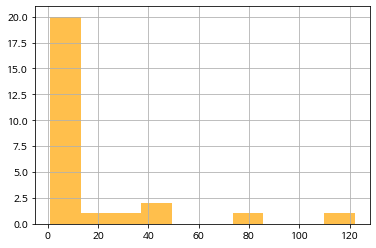

In [34]:
company_count_df.value_counts().hist(bins=10, facecolor='orange', alpha=0.7)

In [35]:
company_count_df.head(13).T.style.background_gradient(axis=None, cmap= sns.light_palette("Orange", as_cmap=True))

,Soma,Bonnat,Fresco,Pralus,A. Morin,Arete,Guittard,Domori,Valrhona,Hotel Chocolat (Coppeneur),Coppeneur,Scharffen Berger,Mast Brothers
count,46,27,26,25,23,22,22,22,21,19,18,17,17


In [36]:
company_count_df.tail(13).T.style.background_gradient(axis=None, cmap= sns.light_palette("Orange", as_cmap=True))

,Lilla,Lindt & Sprungli,Love Bar,Mayacama,Majani,Malagos,Malmo,Manifesto Cacao,Chocablog,Marigold's Finest,Chloe Chocolat,Chequessett,Ki' Xocolatl
count,1,1,1,1,1,1,1,1,1,1,1,1,1


**2. Species**

- bean origin
- bar name

  - 생산된 원산지

In [37]:
df.species.nunique()

1038

In [38]:
df['species'].value_counts()

Madagascar                        56
Peru                              45
Ecuador                           42
Dominican Republic                37
Venezuela                         21
                                  ..
Conacado, #213, DR, -C             1
Sambirano Valley, #215, MR, MC     1
Chuao, #218, MR, MC                1
Chuao, #217, DR, MC                1
Brazil, Mitzi Blue                 1
Name: species, Length: 1038, dtype: int64

In [39]:
round(df['species'].value_counts(normalize=True)*100,2).head(15)

Madagascar            3.12
Peru                  2.51
Ecuador               2.34
Dominican Republic    2.06
Venezuela             1.17
Chuao                 1.06
Sambirano             1.06
Ocumare               0.95
Papua New Guinea      0.84
Ghana                 0.84
Belize                0.73
Bolivia               0.67
Porcelana             0.61
Brazil                0.61
Tanzania              0.61
Name: species, dtype: float64

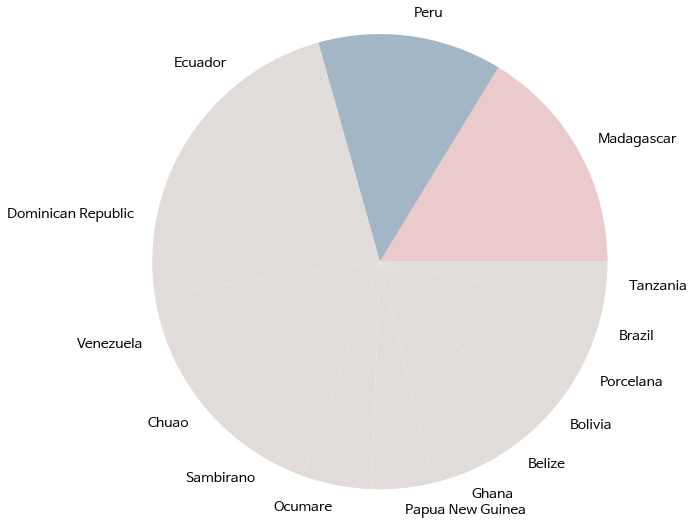

In [40]:
species_names = df['species'].value_counts().index[:15]
species_sizes = df['species'].value_counts().values[:15]
species_group_colors=['#EACACB','#A3B6C5', '#E1DCD9','#E1DCD9', '#E1DCD9','#E1DCD9', '#E1DCD9','#E1DCD9', '#E1DCD9','#E1DCD9', '#E1DCD9','#E1DCD9', '#E1DCD9','#E1DCD9', '#E1DCD9']
species_group_explodes= (0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
fig2= plt.figure(figsize= (9,9))
plt.pie(species_sizes, 
        explode= species_group_explodes, 
        labels= species_names,
        colors= species_group_colors,
        #autopct='%1.1f%%',
        shadow=False,
        startangle=0,
        textprops={'fontsize':14})
plt.axis('equal')
plt.show()

In [41]:
print('전체에서 Madagascar가 차지하는 비율은',round((57/df.species.nunique())*100,2), '% 입니다.')
print('전체에서 Peru가       차지하는 비율은',round((45/df.species.nunique())*100,2), '% 입니다.')

전체에서 Madagascar가 차지하는 비율은 5.49 % 입니다.
전체에서 Peru가       차지하는 비율은 4.34 % 입니다.


- Madagascar와 Peru가 전체의 약 10%를 차지하고 있다.

- 특정 지역에서 많이 생산되는 것을 볼 수 있다.
- 이 지역이 rating에 영향을 주는가?
- 본래 생산지와 같은 경우, 다른 경우 case 나눠 rating과의 상관성 살펴보기

In [42]:
df['company_location'].nunique()

60

겹치는 부분이 있다면 정제해줘야하므로 확인해보겠습니다.

In [43]:
df['company_location'].unique()

array(['France', 'U.S.A.', 'Fiji', 'Ecuador', 'Mexico', 'Switzerland',
       'Netherlands', 'Spain', 'Peru', 'Canada', 'Italy', 'Brazil',
       'U.K.', 'Australia', 'Wales', 'Belgium', 'Germany', 'Russia',
       'Puerto Rico', 'Venezuela', 'Colombia', 'Japan', 'New Zealand',
       'Costa Rica', 'South Korea', 'Amsterdam', 'Scotland', 'Martinique',
       'Sao Tome', 'Argentina', 'Guatemala', 'South Africa', 'Bolivia',
       'St. Lucia', 'Portugal', 'Singapore', 'Denmark', 'Vietnam',
       'Grenada', 'Israel', 'India', 'Czech Republic',
       'Domincan Republic', 'Finland', 'Madagascar', 'Philippines',
       'Sweden', 'Poland', 'Austria', 'Honduras', 'Nicaragua',
       'Lithuania', 'Niacragua', 'Chile', 'Ghana', 'Iceland', 'Eucador',
       'Hungary', 'Suriname', 'Ireland'], dtype=object)

- 에콰도르가 겹칩니다 : Ecuador, Eucador
- Ecuador로 바꿔주겠습니다.

In [44]:
df['company_location'].replace(['Eucador'],'Ecuador',inplace=True)

**3. bean_type**

In [45]:
df['bean_type'].nunique()

41

In [46]:
df['bean_type'].unique()

array(['', 'Criollo', 'Trinitario', 'Forastero (Arriba)', 'Forastero',
       'Forastero (Nacional)', 'Criollo, Trinitario',
       'Criollo (Porcelana)', 'Blend', 'Trinitario (85% Criollo)',
       'Forastero (Catongo)', 'Forastero (Parazinho)',
       'Trinitario, Criollo', 'CCN51', 'Criollo (Ocumare)', 'Nacional',
       'Criollo (Ocumare 61)', 'Criollo (Ocumare 77)',
       'Criollo (Ocumare 67)', 'Criollo (Wild)', 'Beniano', 'Amazon mix',
       'Trinitario, Forastero', 'Forastero (Arriba) ASS', 'Criollo, +',
       'Amazon', 'Amazon, ICS', 'EET', 'Blend-Forastero,Criollo',
       'Trinitario (Scavina)', 'Criollo, Forastero', 'Matina',
       'Forastero(Arriba, CCN)', 'Nacional (Arriba)',
       'Forastero (Arriba) ASSS', 'Forastero, Trinitario',
       'Forastero (Amelonado)', 'Trinitario, Nacional',
       'Trinitario (Amelonado)', 'Trinitario, TCGA', 'Criollo (Amarru)'],
      dtype=object)

----
- ' ' 아무런 값이 쓰여져 있는 항과 'nan'항이 보입니다.
  - 이 항목들을 추려내서 확인 후 제거 여부를 결정하겠습니다.
- Criollo가 보이고 유사항목들이 많이 보입니다. 
  - 세부 항목으로 나뉜 경우도 있지만 나뉘지 않은 부분도 있기 때문에 동일한 항목으로 처리하겠습니다. 
- Trinitario 도 마찬가지로 동일 항목들을 묶어주겠습니다.
- Forastero

- 2개 항목이 묶인 부분도 보입니다.
  - 2개 있는 항목들을 콤마 단위로 나눠 새로운 열을 만들어주겠습니다. 'bean_num'항목
  - blend에 있는 항목 값을 2로 변경해주겠습니다.

  ---

**4. Bean_num**

bean_num 항목을 새로 만들어줄 것입니다.

몇 개의 cacao로 구성되었는지 나타내는 항목입니다.

기본적으로 bean의 개수는 1이므로 1을 더해줍니다.

In [47]:
# bean_num 항목을 만들기 위한 함수 정의
def bean_num(str):
  str = str.split()
  return len(str)+1

In [48]:
df['bean_num']=df['bean_type'].apply(bean_num)

In [49]:
df.bean_num.value_counts()

1    887
2    713
3    180
4     13
Name: bean_num, dtype: int64

(0.0, 1000.0)

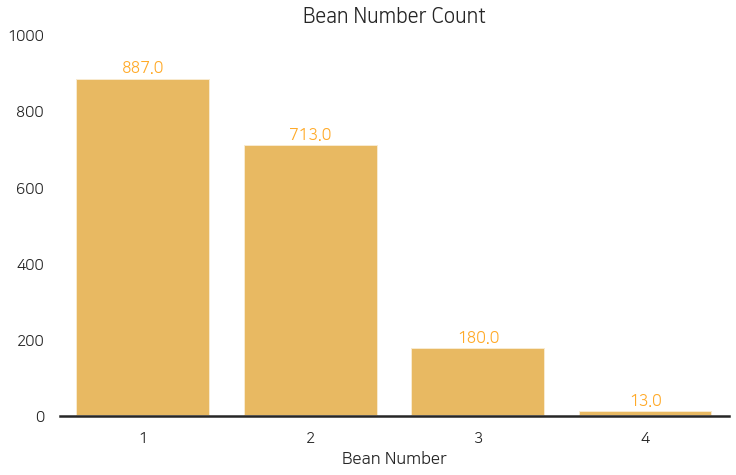

In [50]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig3, axes = plt.subplots(1,1,figsize=(12,7))
fig3.gca().spines['right'].set_visible(False)   #오른쪽 테두리 제거
fig3.gca().spines['top'].set_visible(False)     #위 테두리 제거
fig3.gca().spines['left'].set_visible(False)    #왼쪽 테두리 제거

ax4 = sns.barplot(x=df.bean_num.value_counts().index, y=df.bean_num.value_counts(), color='orange', alpha=0.7)
ax4.set_title('Bean Number Count', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.02))
ax4.set_xlabel('Bean Number', fontsize=17)
ax4.set(ylabel=None)

for p in ax4.patches:
  height= p.get_height()
  ax4.text(p.get_x() + p.get_width() /2., height+14, height, ha='center', size=20, color='#FFAA28', fontsize=16)
ax4.set_ylim(0,1000)

- blend 되었다 안되었다로 또 구분시켜 컬럼을 형성해줄 수 있을 것입니다.(Blended feature)

Blend 들어간 항목의 bean_num를 바꿔줍니다.

In [51]:
df.loc[df['bean_type'].str.contains('Blend'),'bean_num']=2
df[df['bean_type'].str.contains('Blend')].head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num
77,Amedei,Nine,111,2007,75.0,Italy,4.0,Blend,,2
85,Amedei,Toscano Black,170,2007,63.0,Italy,3.5,Blend,,2
86,Amedei,Toscano Black,40,2006,70.0,Italy,5.0,Blend,,2
87,Amedei,Toscano Black,75,2006,66.0,Italy,4.0,Blend,,2
148,Bahen & Co.,Houseblend,999,2012,70.0,Australia,2.5,Blend,,2


bean type을 통일시켜줍니다.

In [52]:
df['bean_type'].replace(['Criollo (Porcelana)','Trinitario (85% Criollo)','Criollo (Ocumare)','Criollo (Ocumare 61)',
                         'Criollo (Ocumare 77)','Criollo (Ocumare 67)','Criollo (Wild)','Criollo, +','Criollo (Amarru)'],'Criollo',inplace=True)
df['bean_type'].replace(['Trinitario (Scavina)','Trinitario (Amelonado)','Trinitario, TCGA'],'Trinitario', inplace=True)
df['bean_type'].replace(['Forastero (Arriba)','Forastero (Nacional)','Forastero (Catongo)','Forastero (Parazinho)',
                         'Forastero (Arriba) ASS','Forastero(Arriba, CCN)','Forastero (Arriba) ASSS','Forastero (Amelonado)'],'Forastero', inplace=True)
df['bean_type'].replace(['Trinitario, Criollo'],'Criollo, Trinitario', inplace=True)  # 이 항목은 2개 그대로 남겨놓겠습니다.
df['bean_type'].replace(['Amazon mix','Amazon, ICS'],'Amazon', inplace=True)
df['bean_type'].replace(['Nacional (Arriba)'],'Nacional', inplace=True)

bean_type이 공백인 항목은 무려 887개입니다. 

모든 행을 제거할 수 없으므로 공백으로 남겨놓고 진행하겠습니다.

nan값은 ' ' 공백으로 대체해주겠습니다.

In [53]:
df.loc[df['bean_type'] == '']

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1
...,...,...,...,...,...,...,...,...,...,...
1787,Zotter,Santo Domingo,879,2012,70.0,Austria,3.75,,Dominican Republic,1
1789,Zotter,"Indianer, Raw",883,2012,58.0,Austria,3.50,,,1
1790,Zotter,Peru,647,2011,70.0,Austria,3.75,,Peru,1
1793,Zotter,Kerala State,781,2011,62.0,Austria,3.25,,India,1


In [54]:
# nan값 '' 공백으로 대체
df.loc[df['bean_type'].str.contains('nan'),'bean_num']=''

bean type value들을 다시 확인해봅니다.

공백 포함 17개가 있고, 공백을 제거하면 16개의 bean type이 존재합니다.

In [55]:
df['bean_type'].nunique()

17

In [56]:
df['bean_type'].value_counts()

                           887
Trinitario                 421
Forastero                  195
Criollo                    174
Criollo, Trinitario         48
Blend                       41
Nacional                     5
Amazon                       5
EET                          3
Matina                       3
Beniano                      3
Trinitario, Forastero        2
Criollo, Forastero           2
Blend-Forastero,Criollo      1
CCN51                        1
Forastero, Trinitario        1
Trinitario, Nacional         1
Name: bean_type, dtype: int64

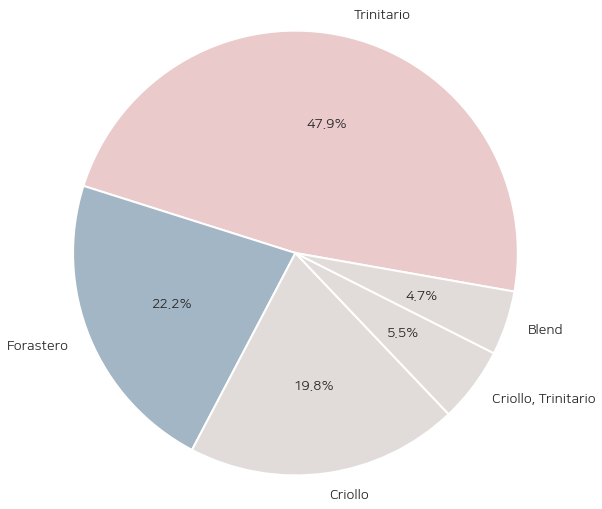

In [57]:
bean_ty_names = df['bean_type'].value_counts().index[1:6]
bean_ty_sizes = df['bean_type'].value_counts().values[1:6]
bean_t_group_colors=['#EACACB','#A3B6C5', '#E1DCD9','#E1DCD9','#E1DCD9']
bean_t_group_explodes= (0.0, 0.0, 0.0, 0.0,0.0)
fig2= plt.figure(figsize= (9,9))
plt.pie(bean_ty_sizes, 
        explode= bean_t_group_explodes, 
        labels= bean_ty_names,
        colors= bean_t_group_colors,
        autopct='%1.1f%%',
        shadow=False,
        startangle=-10,
        textprops={'fontsize':14})
plt.axis('equal')
plt.show()

In [58]:
df['bean_num'].value_counts()

1    887
2    713
3    180
4     13
Name: bean_num, dtype: int64

**5. Blended Feature 생성**

In [59]:
df.head(3)

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1


In [60]:
def blended(int):
  if int>=2:
    x= 1
  else:
    x=0
  return x

In [61]:
df['blended'] = df['bean_num'].apply(blended)

잘 형성된 것을 볼 수 있습니다.

In [62]:
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0


(0.0, 1000.0)

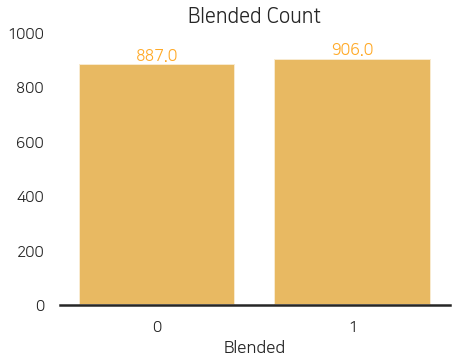

In [63]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig3, axes = plt.subplots(1,1,figsize=(7,5))
fig3.gca().spines['right'].set_visible(False)   #오른쪽 테두리 제거
fig3.gca().spines['top'].set_visible(False)     #위 테두리 제거
fig3.gca().spines['left'].set_visible(False)    #왼쪽 테두리 제거

ax4 = sns.barplot(x=df.blended.value_counts().index, y=df.blended.value_counts(), color='orange', alpha=0.7)
ax4.set_title('Blended Count', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.02))
ax4.set_xlabel('Blended', fontsize=17)
ax4.set(ylabel=None)

for p in ax4.patches:
  height= p.get_height()
  ax4.text(p.get_x() + p.get_width() /2., height+14, height, ha='center', size=20, color='#FFAA28', fontsize=16)
ax4.set_ylim(0,1000)

Blended된 것과 Blended되지 않은 것이 유사하게 분포합니다.

### 수치형

1) REF

In [64]:
df.REF.nunique()

440

- 최근 작성한 것과 최근 작성하지 않은 것의 rating 차이?

2) review_year (순서가 있는 범주형으로 볼 수 있다)

- 연도별 groupby해서 cacao_percent의 빈도 확인 가능
- 연도별 groupby해서 rating 확인
  - 연도에 따른 trend가 있는지 확인할 수 있고, rating과의 연관성도 파악할 수 있음

3) cacao_percent

- 전체 추이 확인 가능
- cacao_percent 분포 확인
- cacao_percent와 rating 확인

## 데이터 설명

- company: 초콜릿바 생산 회사

- species: 제품을 생산한 원산지

- REF    : DB에 들어왔을 때 입력. 최근 리뷰. 
  - 높을수록 최신

- review year: 리뷰한 연도

- cacao_percent: 카카오 함류 비율

- company_location: 회사 위치

- rating: 평점

  Cacao Rating System에 대한 설명은 다음과 같습니다.

  - 5= Elite (Transcending beyond the ordinary limits)
  - 4= Premium (Superior flavor development, character and style)
  - 3= Satisfactory(3.0) to praiseworthy(3.75) (well made with special qualities)
  - 2= Disappointing (Passable but contains at least one significant flaw)
  - 1= Unpleasant (mostly unpalatable)

- bean_type: 본래 생산되는 지역

  ---

새로 생성한 컬럼 설명

- bean_num : cacao bean의 개수
- blended : blended 되었는지의 여부
  - blend 되어있으면 1
  - blend 안되어있으면 0

## 가설 설정

- 회사빈도(g_count)가 rating과의 양의 상관관계를 갖을 것이다. (가설1)

- 특정 지역의 원산지에서 나는 초콜릿이 rating이 높다. (가설2)

- 본래 원산지와 제품의 원산지가 다를 경우에서 rating의 차이가 발생한다. (가설3)

  ---


## 데이터 explore

In [65]:
df.shape

(1793, 11)

총 1793개의 초콜릿에 대한 데이터와 11개의 feature가 있습니다.

In [66]:
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0


### **1. Company**

company의 빈도에 따라 g_count feature를 구성합니다.

In [67]:
df['g_count'] = df.groupby('company')['company'].transform('count')
df

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0,23
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0,23
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0,23
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0,23
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0,23
...,...,...,...,...,...,...,...,...,...,...,...,...
1790,Zotter,Peru,647,2011,70.0,Austria,3.75,,Peru,1,0,17
1791,Zotter,Congo,749,2011,65.0,Austria,3.00,Forastero,Congo,2,1,17
1792,Zotter,Kerala State,749,2011,65.0,Austria,3.50,Forastero,India,2,1,17
1793,Zotter,Kerala State,781,2011,62.0,Austria,3.25,,India,1,0,17


company별로 묶어 확인한 결과는 다음과 같습니다. (평균으로 계산)

In [68]:
company_rate_df= df.groupby('company', as_index=False).mean().sort_values(by='rating', ascending=False)
company_rate_df

,company,REF,review_year,cacao_percent,rating,blended,g_count
380,Tobago Estate (Pralus),895.000000,2012.000000,70.000000,4.000000,1.000000,1.0
183,Heirloom Cacao Preservation (Zokoko),1744.000000,2016.000000,70.000000,3.875000,1.000000,2.0
287,Ocelot,1558.000000,2015.000000,72.500000,3.875000,1.000000,2.0
14,Amedei,180.076923,2007.230769,69.538462,3.846154,0.923077,13.0
249,Matale,1178.000000,2013.000000,71.000000,3.812500,1.000000,4.0
...,...,...,...,...,...,...,...
232,Majani,531.000000,2010.000000,70.000000,2.000000,0.000000,1.0
226,Love Bar,1502.000000,2015.000000,75.000000,2.000000,0.000000,1.0
64,Callebaut,218.500000,2007.500000,65.000000,1.875000,0.500000,2.0
228,Machu Picchu Trading Co.,636.500000,2010.500000,62.500000,1.875000,0.000000,2.0


서로 다른 회사는 총 416개입니다.

In [69]:
company_rate_df.company.nunique()

416

[Text(0, 0.5, '')]

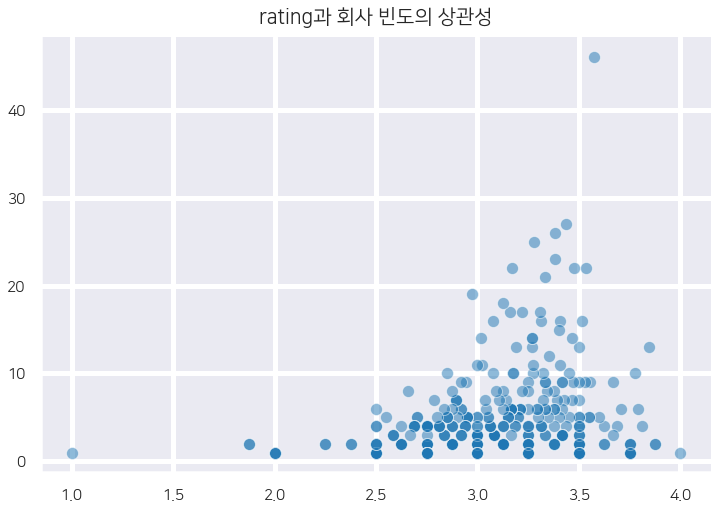

In [70]:
sns.set_style('darkgrid',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig1= plt.figure(figsize=(12,8))
fig1.gca().spines['right'].set_visible(False)   #오른쪽 테두리 제거
fig1.gca().spines['top'].set_visible(False)     #위 테두리 제거
#fig1.gca().spines['left'].set_visible(False)    #왼쪽 테두리 제거
area1= fig1.add_subplot(1,1,1)
area1.set_title('rating과 회사 빈도의 상관성', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax1= sns.scatterplot(x='rating', y='g_count', data=company_rate_df, alpha=0.5)

ax1.set_xlabel('rating',fontproperties=fontprop, fontsize=15)  # x축 레이블이름
ax1.set_ylabel('회사빈도',fontproperties=fontprop, fontsize=15) # y축 레이블이름
ax1.set(xlabel=None)                            # x 레이블 없게함
ax1.set(ylabel=None)                            # y 레이블 없게 함

**회사 빈도와 rating은 약한 상관관계를 갖는다.** 

- H0: 회사 빈도가 높을수록 rating이 높다. (약한 상관관계지만 가설 만족)

- 대부분의 회사빈도는 1 ~ 10 에 있습니다. 

- 평점은 2.5 ~ 3.5 정도에 분포합니다.

- rating 기준 3.0~3.75가 만족, 4점대가 우수, 5점이 elite일 때
  - 4점으로 우수한 회사는 회사 빈도가 낮습니다.
  - 회사 빈도에 따라 rating이 미약하게 우상향을 보임
  - '만족'에 해당하는 rating(3.0 ~ 3.75)는 회사 빈도가 5~30 사이에 위치합니다.

**회사별로 binding시 상관관계 Heatmap**

[Text(100.5, 0.5, '')]

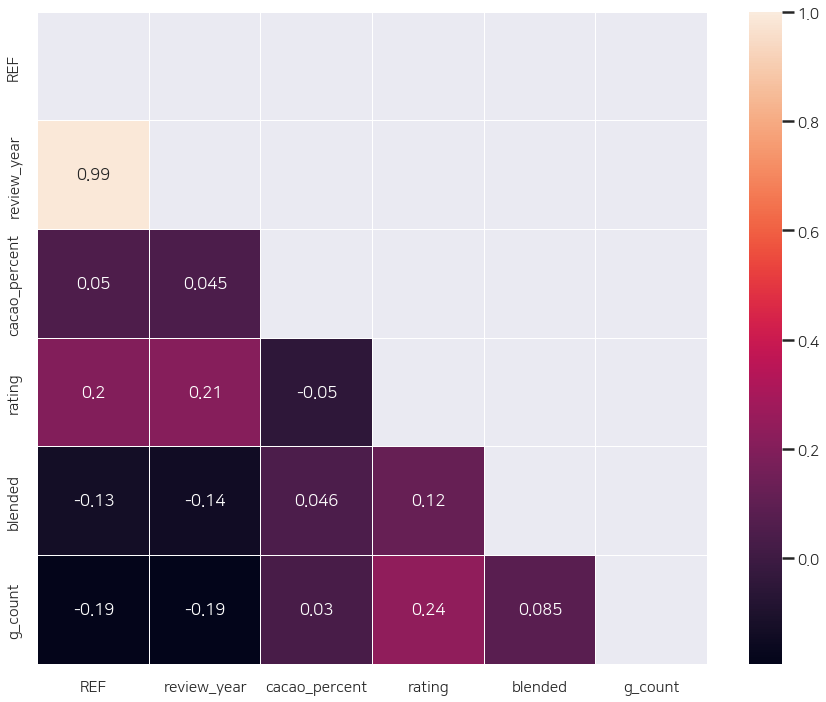

In [71]:
sns.set_style('dark',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig2= plt.figure(figsize=(15,12))
fig2.gca().spines['right'].set_visible(False)   #오른쪽 테두리 제거
fig2.gca().spines['top'].set_visible(False)     #위 테두리 제거
fig2.gca().spines['left'].set_visible(False)    #왼쪽 테두리 제거
area2= fig1.add_subplot(1,1,1)
upp_mat = np.triu(company_rate_df.corr())
ax2= sns.heatmap(data=company_rate_df.corr(), linewidth=0.2, vmax=1.0, annot=True, fmt='.2', mask=upp_mat)
#ax2.set_title('회사에 따른 상관관계', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.2))

ax2.set_xlabel('rating',fontproperties=fontprop, fontsize=15)   # x축 레이블이름
ax2.set_ylabel('회사빈도',fontproperties=fontprop, fontsize=15) # y축 레이블이름
ax2.set(xlabel=None)                                            # x 레이블 없게함
ax2.set(ylabel=None)                                            # y 레이블 없게 

피어슨의 상관계수는 일반적으로,

- 값이 -1.0 ~ -0.7 이면, 강한 음적 상관관계
- 값이 -0.7 ~ -0.3 이면, 뚜렷한 음적 상관관계
- 값이 -0.3 ~ -0.1 이면, 약한 음적 상관관계
- 값이 -0.1 ~ +0.1 이면, 없다고 할 수 있는 상관관계
- 값이 +0.1 ~ +0.3 이면, 약한 양적 상관관계
- 값이 +0.3 ~ +0.7 이면, 뚜렷한 양적 상관관계
- 값이 +0.7 ~ +1.0 이면, 강한 양적 상관관계

  ---


**상관관계**

- 양적 상관관계
  - 강한 양적 상관관계
    - review_year & REF
  - 약한 양적 상관관계
    - g_count & rating
    - review_year & rating
    - REF & rating
    - blended & rating

- 음적 상관관계
  - 약한 음적 상관관계
    - g_count & review_year
    - g_count & REF
    - blended & REF
    - blended & review_year

- 상관관계가 없다 할 수 있는 관계
  - cacao_percent & blended
  - cacao_percent & rating
  - cacao_percent & REF
  - cacao_percent & review_year
  - cacao_percent & g_count
  - g_count & Blended

--> cacao_percent와 correlation 가졌다 할 것은 없습니다.

--> cacao_percent는 rating과 무관하다 할 수 있겠습니다.


**rating과 상관관계를 보이는 것은 blended와 g_count**입니다.

강한 상관관계를 보이는 것은 아니고 약한 양적 상관관계를 보입니다.

- blend 여부보다 g_count가 상관관계가 높음 

- rating이 blended와 상관관계를 보이므로, 추가적으로 blended한 bean의 개수와 rating과 상관성이 있는지 확인해볼 필요가 있습니다.

(0.0, 1000.0)

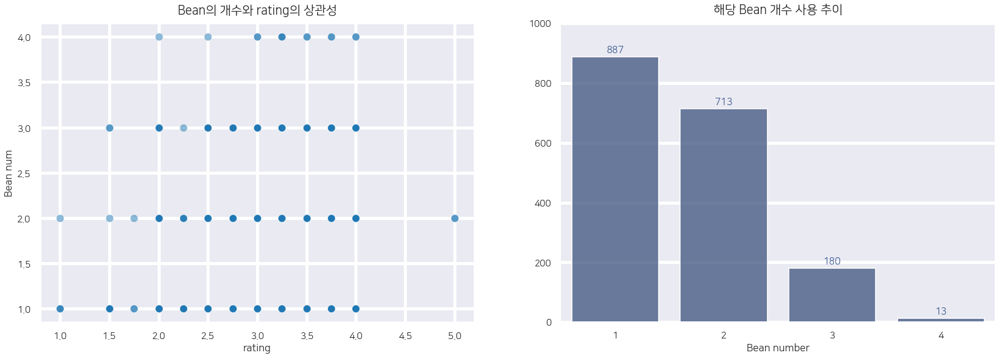

In [72]:
sns.set_style('darkgrid',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig3, axes = plt.subplots(1,2,figsize=(28,9))
fig3.gca().spines['right'].set_visible(False)   #오른쪽 테두리 제거
fig3.gca().spines['top'].set_visible(False)     #위 테두리 제거
fig3.gca().spines['left'].set_visible(False)    #왼쪽 테두리 제거

ax3= sns.scatterplot(x='rating', y='bean_num', data=df, alpha=0.5, ax=axes[0],s=160)
ax3.set_title('Bean의 개수와 rating의 상관성', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax3.set_xlabel('rating', fontsize=17)  # x축 레이블이름
ax3.set_ylabel('Bean num', fontsize=17) # y축 레이블이름

ax4 = sns.countplot(x='bean_num', data=df,color='#3C5A91', ax=axes[1], alpha=0.8)  #BECDFF
ax4.set_title('해당 Bean 개수 사용 추이', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.02))
ax4.set_xlabel('Bean number', fontsize=17)
ax4.set(ylabel=None)

for p in ax4.patches:
  height= p.get_height()
  ax4.text(p.get_x() + p.get_width() /2., height+14, height, ha='center', size=20, color='#3C5A91', fontsize=16)
ax4.set_ylim(0,1000)

In [73]:
blendbean_rating_df = df[['bean_num','rating']]
blendbean_rating= blendbean_rating_df.groupby('bean_num').mean()
blendbean_rating.style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,rating
bean_num,
1,3.137542
2,3.238079
3,3.209722
4,3.288462


Bean의 개수와 해당 개수에 따른 사용률은 반비례합니다. (회사 빈도가 적은 것)

1개 Bean을 사용하는 것이 가장 많고 Bean 개수가 늘어날수록 빈도는 줄어드는 것을 볼 수 있습니다.

한편 bean의 개수에 따른 rating의 평균은 유사하게 나타납니다. 

Rating은 bean의 개수에 따라 우상향 추세를 보입니다.

In [74]:
blendbean_rating = blendbean_rating.reset_index()
blendbean_rating

,bean_num,rating
0,1,3.137542
1,2,3.238079
2,3,3.209722
3,4,3.288462


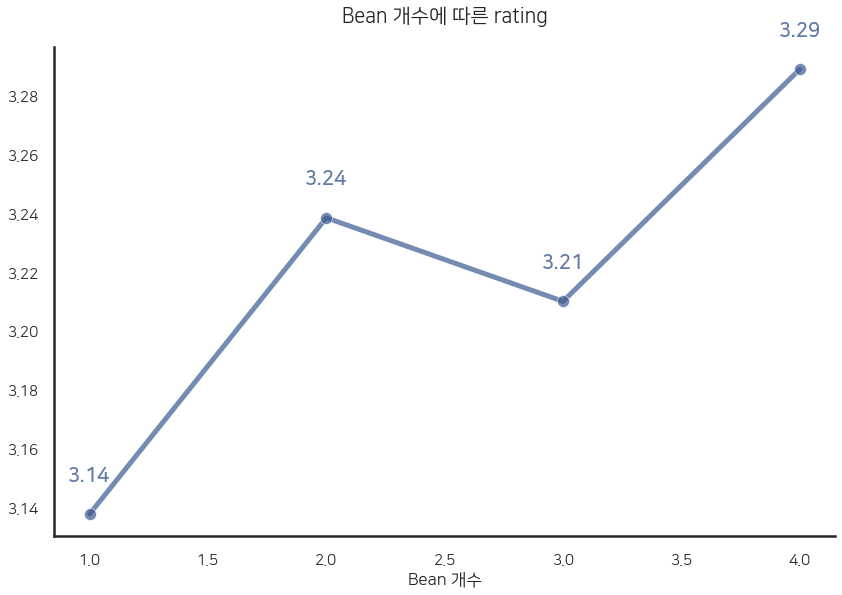

In [75]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig5= plt.figure(figsize=(14,9))
fig5.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig5.gca().spines['top'].set_visible(False)     # 위 테두리 제거
#fig5.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area5= fig5.add_subplot(1,1,1)

area5.set_title('Bean의 개수에 따른 rating 추이', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.05))
ax5 = sns.lineplot(x='bean_num', y='rating', data=blendbean_rating, linewidth=5, color='#3C5A91', alpha=0.7, marker='o')
ax5.set_title('Bean 개수에 따른 rating', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax5.set_xlabel('Bean 개수', fontsize=17)
ax5.set(ylabel=None)

x_line = blendbean_rating['bean_num']
y_line= blendbean_rating['rating']

# 그래프에 숫자 표시
for i in range(len(x_line)):
  height= y_line[i]
  plt.text(x_line[i], height+0.01, '%.2f' %height, ha='center', va='bottom', size=20, fontweight='bold', fontdict={'color':'#3C5A91', 'fontweight':'bold'}, alpha=0.8)

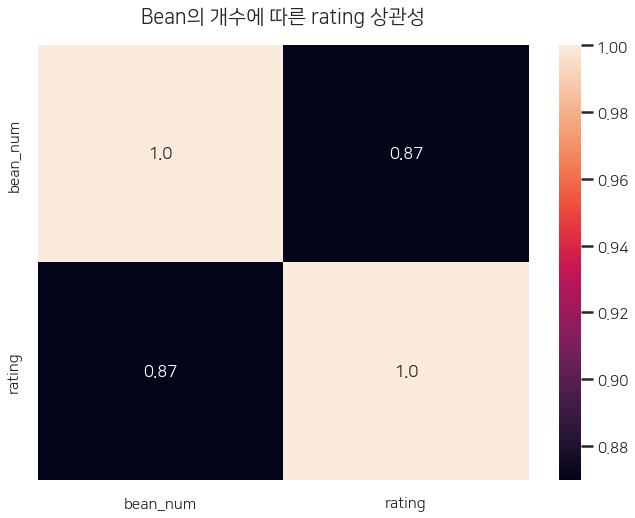

In [76]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig6= plt.figure(figsize=(11,8))
fig6.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig6.gca().spines['top'].set_visible(False)     # 위 테두리 제거
#fig6.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area6= fig6.add_subplot(1,1,1)

area6.set_title('Bean의 개수에 따른 rating 상관성', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.04))
ax6=sns.heatmap(data=blendbean_rating.corr(),annot=True, fmt='.2')

- bean의 개수와 rating은 강한 양적 상관관계를 보입니다.

정리:

- Blended와 rating은 약하지만 상관관계를 보인다.

- Bean의 개수를 많이 사용하는 곳은 적지만, bean의 개수와 rating이 강한 상관관계를 보이므로 늘리는 것이 좋을 것이다.

In [77]:
# bean 개수를 많이 사용할 수 있으면 사용하는 것이 좋다.

**회사 빈도 & company location**

두 번째로 company_location에 따른 g_count(회사 개수 분포)가 상관관계를 갖는지 확인해보겠습니다.

이는 location에 따른 영향력을 확인하고 rating과의 상관성을 파악하기 위함입니다.

**H0: company location에 따른 company 빈도와 rating이 상관관계를 갖는다.**

In [78]:
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0,23
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0,23
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0,23
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0,23
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0,23


**1-2. company_location에 따라 다시 구성**

In [79]:
# company_location에 따라 평균을 기준으로하여 묶습니다. Rating에 따라 내림차순하도록 하겠습니다.
company_location_df= df.groupby('company_location', as_index=False).mean().sort_values(by='rating', ascending=False)
company_location_df.head()

,company_location,REF,review_year,cacao_percent,rating,blended,g_count
8,Chile,1638.000000,2015.000000,70.000000,3.750000,1.000000,2.0
0,Amsterdam,1569.500000,2015.000000,73.250000,3.500000,1.000000,2.5
34,Netherlands,1944.000000,2017.000000,70.000000,3.500000,1.000000,4.0
39,Philippines,1121.000000,2013.000000,65.000000,3.500000,1.000000,1.0
24,Iceland,1436.666667,2014.666667,68.666667,3.416667,0.666667,3.0


In [80]:
company_location_df.company_location.nunique()

59

회사는 서로 다른 **59개의 지역**에 위치합니다. 

회사 위치에 따라 묶었기 때문에 회사 위치에 따라 회사의 분포가 어떻게 달라지는와, 회사 위치 분포에 따른 rating을 확인할 수 있습니다.

heatmap을 통해 전체 추이를 파악해보겠습니다.

Text(0.5, 1.15, '회사의 위치에 따른 상관관계')

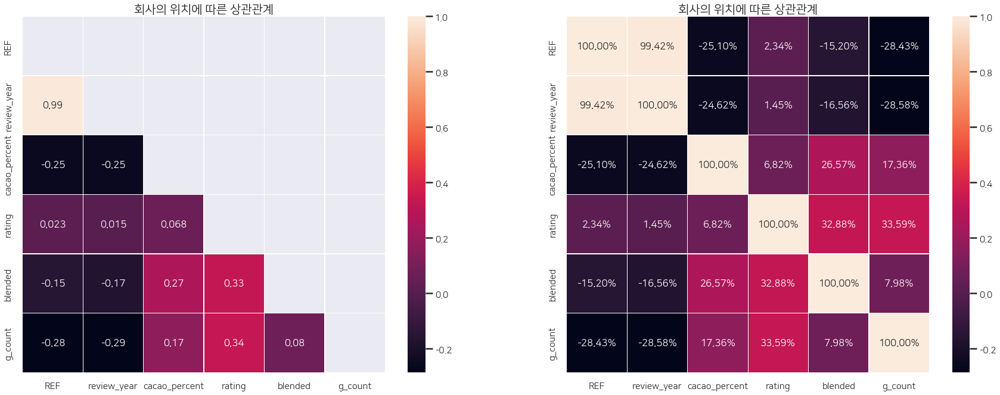

In [81]:
sns.set_style('dark',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig7, axes = plt.subplots(1,2,figsize=(30,11))
fig7.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig7.gca().spines['top'].set_visible(False)     # 위 테두리 제거
#fig7.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거

upp_mat_comloc = np.triu(company_rate_df.corr())

# 전체 heatmap
ax7=sns.heatmap(data=company_location_df.corr(),annot=True, fmt='.2%', linewidth=0.2, vmax=1.0, ax=axes[1])
ax7.set_title('회사의 위치에 따른 상관관계', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.15))

# masked heatmap
ax8=sns.heatmap(data=company_location_df.corr(),annot=True, fmt='.2', linewidth=0.2, vmax=1.0, mask=upp_mat_comloc, ax=axes[0])
ax8.set_title('회사의 위치에 따른 상관관계', fontsize=15, fontproperties=fontprop, position=(0.5, 1.0+0.15))

- 양적 상관관계
  - 강한 양적 상관관계: review year & REF
  - 뚜렷한 양적 상관관계: rating & blended, rating & g_count
  - 약한 상관관계: cacao_percent & blended, cacao_percent & g_count

- 음적 상관관계
  - 약한 음적 상관관계: cacao_percent & REF, cacao_percent & review_year, blended & REF, 
  
    blended & review_year, g_count & REF, g_count & review_year

- 상관성이 없다 할 수 있는 관계
  - rating & REF, rating & review_year, rating & cacao_percent, blended & REF, blended & review_year, g_count & blended

Rating 과 상관관계를 보이는 항목은 blended, g_count 입니다.

특히 강한 상관관계를 보이는 것은 g_count입니다.

- location에 따라 blended와 g_count(회사 분포)가 강한 상관관계를 보입니다.

**location별로 묶어줬을 때 g_count 분포(초콜릿 회사 분포)**

----

회사 분포순에 따라 내림차순으로 배열하겠습니다.

In [82]:
company_loc_count_df = company_location_df.sort_values(by='g_count', ascending=False)
company_loc_count_df.head()

,company_location,REF,review_year,cacao_percent,rating,blended,g_count
7,Canada,1243.072581,2013.564516,72.370968,3.318548,0.516129,21.467742
17,France,696.166667,2010.358974,71.762821,3.251603,0.500000,17.410256
3,Austria,1178.076923,2013.230769,72.000000,3.240385,0.500000,12.846154
28,Italy,505.809524,2009.269841,71.190476,3.325397,0.714286,12.492063
23,Hungary,1151.181818,2012.909091,72.318182,3.204545,0.590909,12.454545


먼저 location별 회사 분포 Top30을 확인하고, rating 추이를 확인하겠습니다.

[Text(0, 0.5, '')]

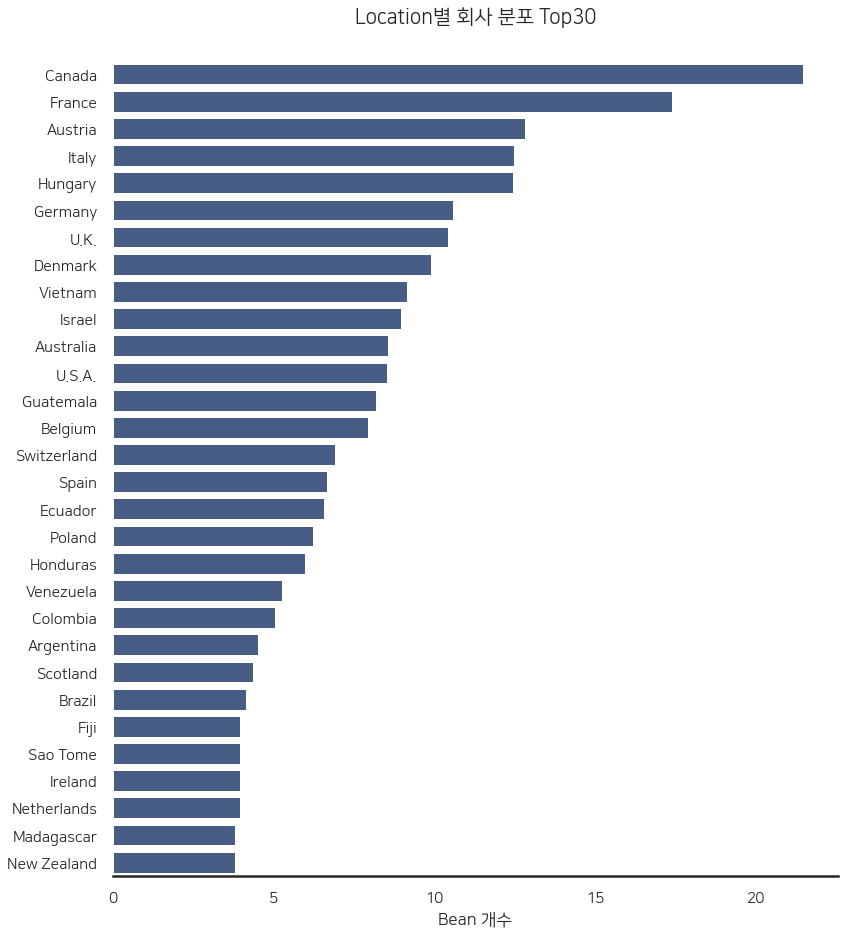

In [83]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig9= plt.figure(figsize=(13,15))
fig9.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig9.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig9.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area9= fig9.add_subplot(1,1,1)

ax9=sns.barplot(x= 'g_count',y='company_location',data=company_loc_count_df.iloc[:30,:], color='#3C5A91', ax=area9)
ax9.set_title('Location별 회사 분포 Top30', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax9.set_xlabel('Bean 개수', fontsize=17)
ax9.set(ylabel=None)

회사 분포에 따라 내림차순을 했기 때문에 회사 분포 내림차순에 따른 rating 흐름을 파악할 수 있습니다.

[Text(0, 0.5, '')]

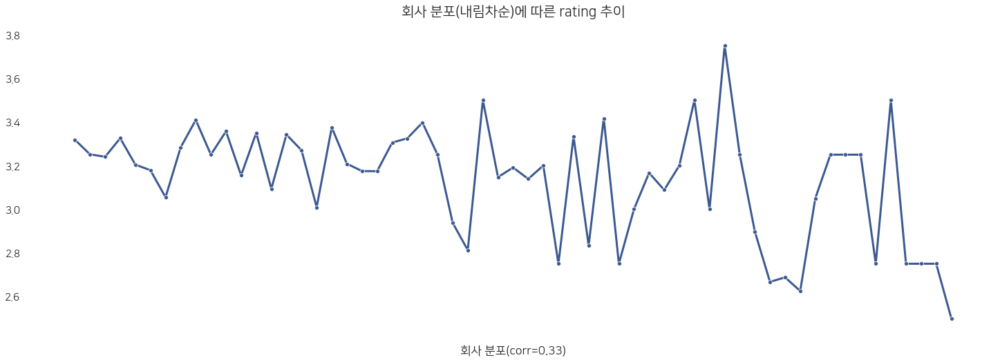

In [84]:
# company_location, rating
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig10= plt.figure(figsize=(25,8))
fig10.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig10.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig10.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
fig10.gca().spines['bottom'].set_visible(False)  # 아래 테두리 제거
area10= fig10.add_subplot(1,1,1)

ax10=sns.lineplot(x= 'company_location',y='rating',data=company_loc_count_df, color='#3C5A91', ax=area10, marker='.')
ax10.set_title('회사 분포(내림차순)에 따른 rating 추이', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax10.set_xlabel('회사 분포(corr=0.33)', fontsize=17)
ax10.set_xticklabels(ax10.get_xticklabels(),rotation = 90)
ax10.set(ylabel=None)

회사 분포가 많은 순이므로 불규칙한 분포를 보이나 그래프가 나타내는 우하향 추이가 **약한 상관관계**를 보이고 있음을 알 수 있습니다.

In [85]:
company_loc_count_df['g_count'].corr(company_loc_count_df['rating'])

0.3359382853004601

따라서 회사의 location이 rating에 영향력을 가진다 할 수 있을 것입니다.

**g_count & blended 추이**

Blended 역시 location에 따라 강한 영향력을 보였습니다.

그렇다면 location에 따른 그룹의 수와 bean의 blended 여부가 어떤 상관성을 보이는지 살펴보겠습니다.

(rating과 위치에 따른 회사 빈도가 상관관계를 보였기 때문에 blended 추이를 확인해 회사의 blended 양상을 확인할 수 있을 것입니다.)

In [86]:
company_location_df.head()

,company_location,REF,review_year,cacao_percent,rating,blended,g_count
8,Chile,1638.000000,2015.000000,70.000000,3.750000,1.000000,2.0
0,Amsterdam,1569.500000,2015.000000,73.250000,3.500000,1.000000,2.5
34,Netherlands,1944.000000,2017.000000,70.000000,3.500000,1.000000,4.0
39,Philippines,1121.000000,2013.000000,65.000000,3.500000,1.000000,1.0
24,Iceland,1436.666667,2014.666667,68.666667,3.416667,0.666667,3.0


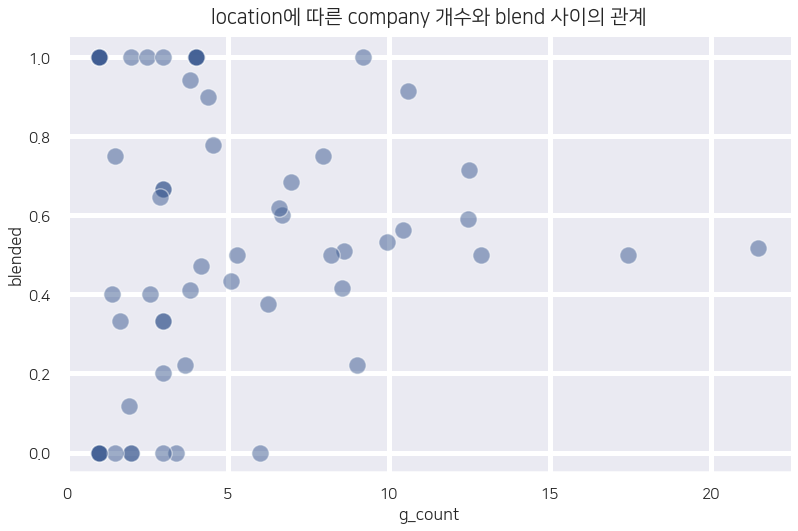

In [87]:
sns.set_style('darkgrid',{'font.family':'NanumSquare'})

fig11= plt.figure(figsize=(13,8))
fig11.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig11.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig11.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area11= fig11.add_subplot(1,1,1)

area11.set_title('location에 따른 company 개수와 blend 사이의 관계', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax11 = sns.scatterplot(x="g_count", y="blended", data=company_location_df, alpha=0.5, ax=area11, color='#3C5A91', s=300, marker='o')

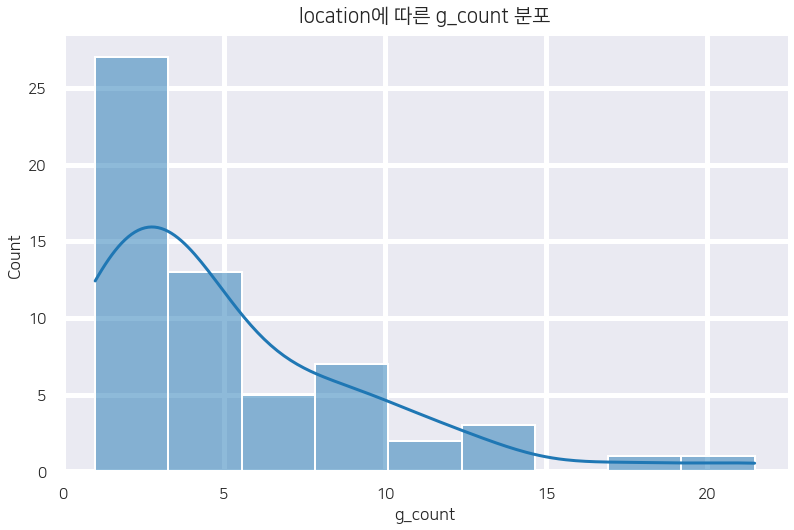

In [88]:
fig11= plt.figure(figsize=(13,8))
fig11.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig11.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig11.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area11= fig11.add_subplot(1,1,1)
area11.set_title('location에 따른 g_count 분포', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
sns.histplot(company_location_df.g_count, kde=True)

- 보통 지역에 따른 company의 수가 1~10 사이에 위치함
- 0~5가 가장 많고 blended 기준 1은 blended했다, 0은 blended 안했다는 것을 의미하므로 blended 여부와는 상관없음을 확인할 수 있다.

In [89]:
# location에 따른 blend는 관련이 없다.
# location에 따라 blend 여부가 달라지지 않는다.
# 지역에 따른 회사 분포와 rating은 영향력이 있지만, 그 지역이 blend를 하는 트랜드를 갖고 있는 것은 아니다.

따라서 지역에 따라 회사의 분포가 영향을 가졌고, 회사분포에 따라 rating이 달라졌지만 회사의 분포가 Blended와는 상관이 없음을 확인하였습니다.

지역에 따른 Blended에 대한 영향력이 없음을 의미합니다. (지역과 Blended 여부와는 무관)

그러나 앞서 heatmap을 통해 blended가 rating과 상관관계를 보였음을 확인했습니다.

blended와 rating이 실제로 어떤 분포를 보이는지 확인해보도록 하겠습니다.

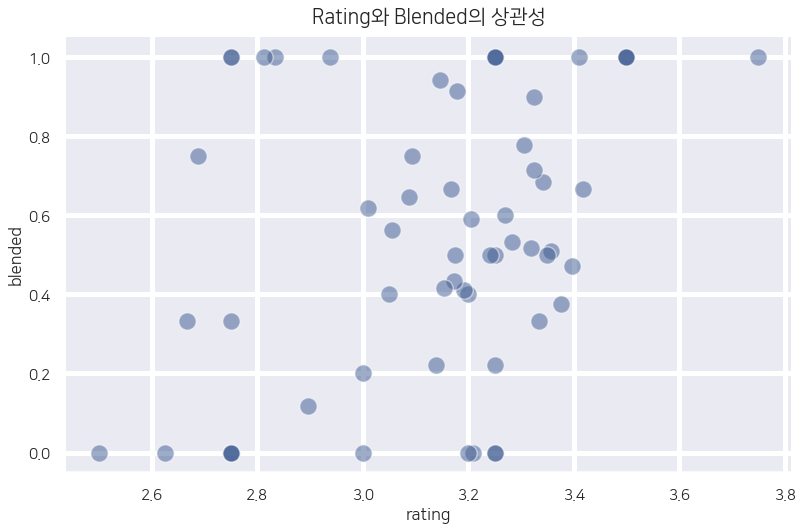

In [90]:
sns.set_style('darkgrid',{'font.family':'NanumSquare'})

fig11= plt.figure(figsize=(13,8))
fig11.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig11.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig11.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area11= fig11.add_subplot(1,1,1)

area11.set_title('Rating와 Blended의 상관성', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax11 = sns.scatterplot(x="rating", y="blended", data=company_location_df, alpha=0.5, ax=area11, color='#3C5A91', s=300, marker='o')

- 약한 우상향

- 상대적으로 낮은 rating을 갖고 있는 초콜릿은 Blend를 안한 경우가 많습니다.

- 중간 정도의 rating으로 "만족"에 해당하는 부분은 blend를 한 경우와 안한 경우가 섞여있습니다.

- 반면 모든 초콜릿 bean에 대해 blend를 한 경우 고르게 분포하긴 했지만 만족을 제공하는 rating이 두드러지고, 

  만족 이상의 "우수하다"는 평을 받았습니다.  

In [91]:
company_location_df['blended'].corr(company_location_df['rating'])

0.32882232781095455

In [92]:
# blend 하는 것이 좋다.

**company location들의 수 : company_country_cnt feature**

company가 위치한 location(국가)별로 묶은 수를 세워 company_country_cnt feature를 만들어줍니다.

In [93]:
print(f'company의 지역은 총 {df.company_location.nunique()}곳의 장소로 구성되어 있습니다.')

company의 지역은 총 59곳의 장소로 구성되어 있습니다.


In [94]:
df_com_loc_df = df[['company_location','rating']]
df_com_loc_df['company_country_cnt']= df_com_loc_df.groupby('company_location')['company_location'].transform('count')
df_com_loc_df

,company_location,rating,company_country_cnt
0,France,3.75,156
1,France,2.75,156
2,France,3.00,156
3,France,3.50,156
4,France,3.50,156
...,...,...,...
1790,Austria,3.75,26
1791,Austria,3.00,26
1792,Austria,3.50,26
1793,Austria,3.25,26


In [95]:
df_com_loc_df['company_country_cnt'].corr(df_com_loc_df['rating'])

-0.050321053307773

회사가 위치한 국가빈도와 rating은 상관관계가 없다고 볼 수 있겠습니다.

In [96]:
# 국가에 따라 rating이 달라지지 않는다.

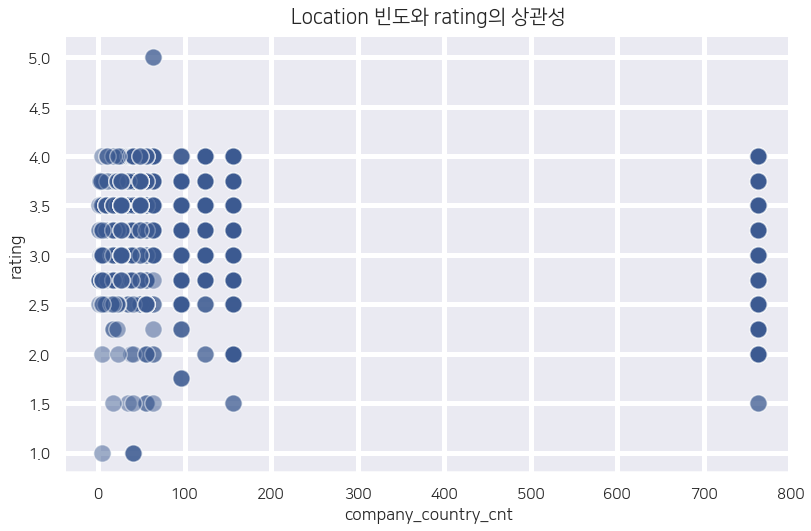

In [97]:
sns.set_style('darkgrid',{'font.family':'NanumSquare'})

fig14= plt.figure(figsize=(13,8))
fig14.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig14.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig14.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area14= fig14.add_subplot(1,1,1)

area14.set_title('Location 빈도와 rating의 상관성', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax14 = sns.scatterplot(x="company_country_cnt", y="rating", data=df_com_loc_df, alpha=0.5, ax=area14, color='#3C5A91', s=300, marker='o')

회사가 위치한 국가에 따른 rating 분포는 회사가 위치한 국가 빈도에 따른 rating을 통해 알 수 있습니다.

같은 회사에서 출시한 초콜릿 제품들이 다른 rating 점수를 갖는 경우가 있기 때문에 상-하의 분포가 나타나는 것으로 보여집니다.

그러나 주목할 만한 것은 국가별 추이와 무관하게 거의 모든 영역에서 rating 분포가 유사하게 나타납니다.

보통 2점에서 4점대로 가장 많이 나타나는 것을 확인할 수 있습니다. 

### 2.Bean

**g_count & bean type**

bean type을 확인하려면 다시 본래 데이터셋으로 돌아가야합니다.

In [98]:
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0,23
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0,23
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0,23
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0,23
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0,23


In [99]:
print(f'Bean type은 {df.bean_type.nunique()}종으로 이루어져 있습니다.')

Bean type은 17종으로 이루어져 있습니다.


bean type 중 공백을 제거하여 살펴보겠습니다.

In [100]:
df2 = df[df.bean_type != '']
df2

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count
5,A. Morin,Carenero,1315,2014,70.0,France,2.75,Criollo,Venezuela,2,1,23
7,A. Morin,Sur del Lago,1315,2014,70.0,France,3.50,Criollo,Venezuela,2,1,23
8,A. Morin,Puerto Cabello,1319,2014,70.0,France,3.75,Criollo,Venezuela,2,1,23
11,A. Morin,Madagascar,1011,2013,70.0,France,3.00,Criollo,Madagascar,2,1,23
17,A. Morin,Chuao,1015,2013,70.0,France,4.00,Trinitario,Venezuela,2,1,23
...,...,...,...,...,...,...,...,...,...,...,...,...
1784,Zotter,El Oro,879,2012,75.0,Austria,3.00,Forastero,Ecuador,3,1,17
1785,Zotter,Huiwani Coop,879,2012,75.0,Austria,3.00,"Criollo, Trinitario",Papua New Guinea,3,1,17
1788,Zotter,"Kongo, Highlands",883,2012,68.0,Austria,3.25,Forastero,Congo,2,1,17
1791,Zotter,Congo,749,2011,65.0,Austria,3.00,Forastero,Congo,2,1,17


In [101]:
print(f'전체 데이터셋은 {df.shape[0]}이며 bean_type에서 공백을 제외하였을 경우 {df2.shape[0]}개의 데이터셋이 남습니다.')

전체 데이터셋은 1793이며 bean_type에서 공백을 제외하였을 경우 906개의 데이터셋이 남습니다.


In [102]:
df.shape[0]-df2.shape[0]

887

- 887의 항목이 고려되지 않았음

[Text(0, 0.5, '')]

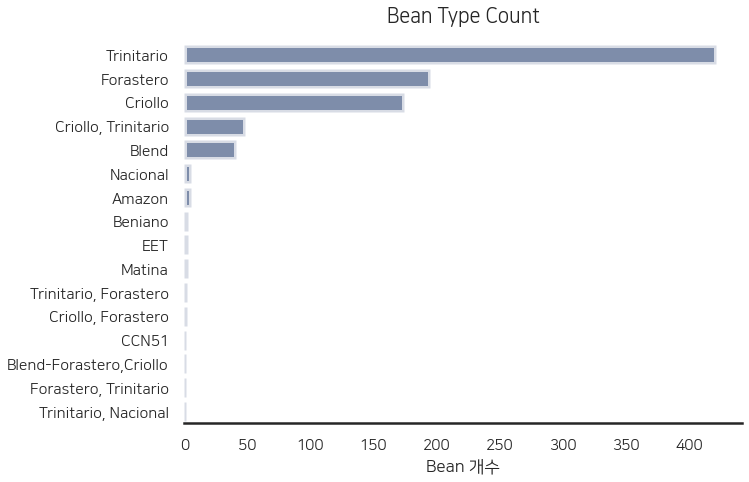

In [103]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig12= plt.figure(figsize=(10,7))
fig12.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig12.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig12.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area12= fig12.add_subplot(1,1,1)

ax12 = sns.countplot(y='bean_type', data=df2, linewidth=5, color='#3C5A91', alpha=0.7, order=df2.bean_type.value_counts().index)
ax12.set_title('Bean Type Count', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax12.set_xlabel('Bean 개수', fontsize=17)
ax12.set(ylabel=None)

[Text(0, 0.5, '')]

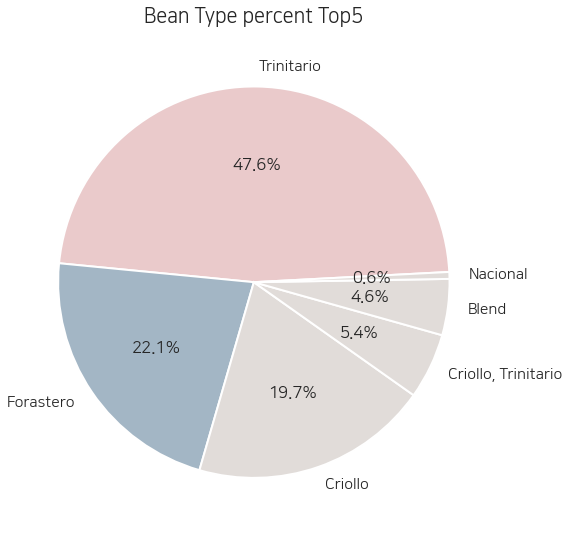

In [104]:
fig, ax = plt.subplots(1,1, figsize=(9,9)) 
colors = ['#EACACB','#A3B6C5', '#E1DCD9','#E1DCD9','#E1DCD9','#E1DCD9']
df2.bean_type.value_counts()[:6].plot.pie(explode=[0.0, 0.0, 0.0, 0.0, 0.0, 0.0],autopct='%1.1f%%',ax=ax,shadow=False,startangle=3, colors= colors)
ax.set_title('Bean Type percent Top5',fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.02))
ax.set(xlabel=None)
ax.set(ylabel=None)

- Bean이 중복된 경우 따로 분리하기 어려워 정확한 추이를 내긴 어려웠지만 특정 Bean 종류가 두드러져 나타나는 것을 확인할 수 있습니다.

- Trinitario 라는 Bean이 두 번째인 Forastero보다 약 2배의 사용률을 보이며 가장 많이 사용되고 있고,

  Forastero, Criollo 등으로 이어집니다. Blend된 경우가 다음을 차지합니다.

**Bean 종류와 rating의 상관성**

In [105]:
bean_rating_df = df2[['bean_type','rating']]
bean_rating_df

,bean_type,rating
5,Criollo,2.75
7,Criollo,3.50
8,Criollo,3.75
11,Criollo,3.00
17,Trinitario,4.00
...,...,...
1784,Forastero,3.00
1785,"Criollo, Trinitario",3.00
1788,Forastero,3.25
1791,Forastero,3.00


bean type 해당 개수에 따라 type의 총 개수를 feature로 형성해주었습니다.

type_count와 rating의 상관관계를 파악해보겠습니다.

In [106]:
bean_rating_df['type_count'] = bean_rating_df.groupby('bean_type')['bean_type'].transform('count')
bean_rating_df

,bean_type,rating,type_count
5,Criollo,2.75,174
7,Criollo,3.50,174
8,Criollo,3.75,174
11,Criollo,3.00,174
17,Trinitario,4.00,421
...,...,...,...
1784,Forastero,3.00,195
1785,"Criollo, Trinitario",3.00,48
1788,Forastero,3.25,195
1791,Forastero,3.00,195


In [107]:
bean_rating_df['type_count'].corr(bean_rating_df['rating'])

-0.008635535262462956

상관관계가 없다고 볼 수 있는 수치로 나타났습니다.

즉 bean type이 많이 쓰이는 것이 rating에는 영향을 주지 않는 것으로 보입니다.

In [108]:
# bean blended만 되어있다면 개수는 중요하지 않다

In [109]:
bean_rating_df.groupby('bean_type').mean().style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,rating,type_count
bean_type,,
Amazon,3.600000,5.000000
Beniano,3.583333,3.000000
Blend,3.353659,41.000000
"Blend-Forastero,Criollo",3.750000,1.000000
CCN51,3.500000,1.000000
Criollo,3.267241,174.000000
"Criollo, Forastero",3.625000,2.000000
"Criollo, Trinitario",3.244792,48.000000
EET,3.583333,3.000000


전체적으로 bean에 대한 선호도와 무관하게 rating의 평균은 유사하게 나타납니다.

이를 통해 몇 개의 Bean Type이 들어갔는지는 Blended만 되어있다면 rating에 영향을 주지 않음을 알 수 있으며,

Bean Type 역시 rating에 영향을 주지 않는다는 것을 알 수 있습니다.

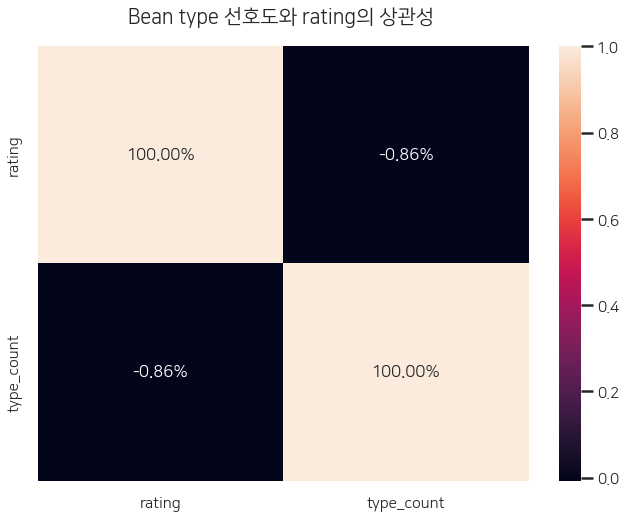

In [110]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig13= plt.figure(figsize=(11,8))
fig13.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig13.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig13.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area13= fig13.add_subplot(1,1,1)

area13.set_title('Bean type 선호도와 rating의 상관성 ', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.04)) #color='white' (저장시)
ax13=sns.heatmap(data=bean_rating_df.corr(),annot=True, fmt='.2%')

# 색상 바꾸기
#ax13.spines['bottom'].set_color('white')
#ax13.spines['top'].set_color('white')
#ax13.xaxis.label.set_color('white')
#ax13.tick_params(axis='x', colors='white')
#ax13.tick_params(axis='y', colors='white')

#plt.savefig('Bean_type_heatmap',transparent=True)

heatmap을 통해서도 전혀 관련이 없다 볼 수 있는 수치로 나타납니다.

**Bean의 원산지와 초콜릿 제품을 위해 Bean이 자라난 곳의 분포 확인**

In [111]:
df.species.nunique()

1038

In [112]:
df.bean_origin.nunique()

99

원산지와 생산지에 같은 곳이 있는지 확인하기 위해 species열과 bean_origin에 대한 리스트를 만들어줍니다.

In [113]:
species_list = set(list(df.species.unique()))
bean_origin_list = set(list(df.bean_origin.unique()))
print(f'species에는 {len(species_list)} 곳이 있습니다.')
print(f'bean_origin에는 {len(bean_origin_list)} 곳이 있습니다.')

species에는 1038 곳이 있습니다.
bean_origin에는 99 곳이 있습니다.


In [114]:
print(f'공통된 장소는 {len(species_list.intersection(bean_origin_list))} 곳 입니다.')

공통된 장소는 49 곳 입니다.


공통된 장소들은 다음과 같습니다.

여러 장소에서 자라난 경우가 상당히 보이지만 그대로 남겨놓도록 하겠습니다.

In [115]:
species_list.intersection(bean_origin_list)

{'Australia',
 'Belize',
 'Bolivia',
 'Brazil',
 'Carribean',
 'Colombia',
 'Congo',
 'Costa Rica',
 'Cuba',
 'Dominican Republic',
 'Ecuador',
 'El Salvador',
 'Gabon',
 'Ghana',
 'Ghana, Panama, Ecuador',
 'Grenada',
 'Guatemala',
 'Haiti',
 'Honduras',
 'India',
 'Indonesia',
 'Ivory Coast',
 'Jamaica',
 'Liberia',
 'Madagascar',
 'Mexico',
 'Nicaragua',
 'Nigeria',
 'Panama',
 'Papua New Guinea',
 'Peru',
 'Peru, Madagascar',
 'Principe',
 'Puerto Rico',
 'Sao Tome',
 'Sao Tome & Principe',
 'South America',
 'Sri Lanka',
 'St. Lucia',
 'Tanzania',
 'Tobago',
 'Trinidad',
 'Trinidad-Tobago',
 'Uganda',
 'Vanuatu',
 'Venezuela',
 'Venezuela, Trinidad',
 'Vietnam',
 'West Africa'}

원산지와 재배지의 품목에 대한 일치 여부를 확인해보겠습니다.

조건을 만들어 확인해본 결과 401 품목에 대해서 일치합니다.

In [116]:
condition2 = (df.species.values == df.bean_origin.values)
same_born_df = df[condition2]
same_born_df

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count
6,A. Morin,Cuba,1315,2014,70.0,France,3.50,,Cuba,1,0,23
10,A. Morin,Panama,1011,2013,70.0,France,2.75,,Panama,1,0,23
11,A. Morin,Madagascar,1011,2013,70.0,France,3.00,Criollo,Madagascar,2,1,23
12,A. Morin,Brazil,1011,2013,70.0,France,3.25,,Brazil,1,0,23
16,A. Morin,Papua New Guinea,1015,2013,70.0,France,3.25,,Papua New Guinea,1,0,23
...,...,...,...,...,...,...,...,...,...,...,...,...
1734,Whittakers,Ghana,733,2011,72.0,New Zealand,2.50,Forastero,Ghana,2,1,1
1753,Woodblock,Ecuador,825,2012,70.0,U.S.A.,2.50,,Ecuador,1,0,8
1754,Woodblock,Costa Rica,825,2012,70.0,U.S.A.,3.00,,Costa Rica,1,0,8
1790,Zotter,Peru,647,2011,70.0,Austria,3.75,,Peru,1,0,17


In [117]:
print('같은 장소에서 재배된 bean을 가진 초콜릿 품목은 전체 대비 ',round(same_born_df.shape[0]/df.shape[0],2),'를 차지합니다.')

같은 장소에서 재배된 bean을 가진 초콜릿 품목은 전체 대비  0.22 를 차지합니다.


bean의 원산지는 총 99곳입니다. 그러나 초콜릿을 위한 bean이 재배된 곳은 1000곳이 넘는 것으로 확인됩니다. 동일한 장소에서 재배된 초콜릿 원 품종은 22%의 비율을 보입니다.

이에 대한 이유가 있을 수 있겠다라는 가정을 했습니다.

- **H0: bean의 원산지와 재배지가 동일한 경우 rating이 높다.**

- 원산지에 여러 장소가 있는 경우는 blended된 항목일 것으로 추정하였지만 정확한 확인이 필요합니다.
  - 확인 결과: 무관하다.

In [118]:
df[df.species.str.contains(',')]

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count
23,Acalli,"Chulucanas, El Platanal",1462,2015,70.0,U.S.A.,3.75,,Peru,1,0,2
24,Acalli,"Tumbes, Norandino",1470,2015,70.0,U.S.A.,3.75,Criollo,Peru,2,1,2
26,Adi,"Vanua Levu, Toto-A",705,2011,80.0,Fiji,3.25,Trinitario,Fiji,2,1,4
28,Adi,"Vanua Levu, Ami-Ami-CA",705,2011,72.0,Fiji,3.50,Trinitario,Fiji,2,1,4
29,Aequare (Gianduja),"Los Rios, Quevedo, Arriba",370,2009,55.0,Ecuador,2.75,Forastero,Ecuador,3,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...
1782,Zotter,"Satipo Pangoa region, 20hr conche",875,2012,70.0,Austria,3.50,Criollo,Peru,3,1,17
1783,Zotter,"Loma Los Pinos, Yacao region, D.R.",875,2012,62.0,Austria,3.75,,Dominican Republic,1,0,17
1788,Zotter,"Kongo, Highlands",883,2012,68.0,Austria,3.25,Forastero,Congo,2,1,17
1789,Zotter,"Indianer, Raw",883,2012,58.0,Austria,3.50,,,1,0,17


여러 species를 가진 품목을 추려 blended feature를 확인해보았습니다.

blended된 것과 blended 되지 않은 것이 보입니다.

In [119]:
df3 = df[df.species.str.contains(',')][['species','blended']]
df3

,species,blended
23,"Chulucanas, El Platanal",0
24,"Tumbes, Norandino",1
26,"Vanua Levu, Toto-A",1
28,"Vanua Levu, Ami-Ami-CA",1
29,"Los Rios, Quevedo, Arriba",1
...,...,...
1782,"Satipo Pangoa region, 20hr conche",1
1783,"Loma Los Pinos, Yacao region, D.R.",0
1788,"Kongo, Highlands",1
1789,"Indianer, Raw",0


(0.0, 370.0)

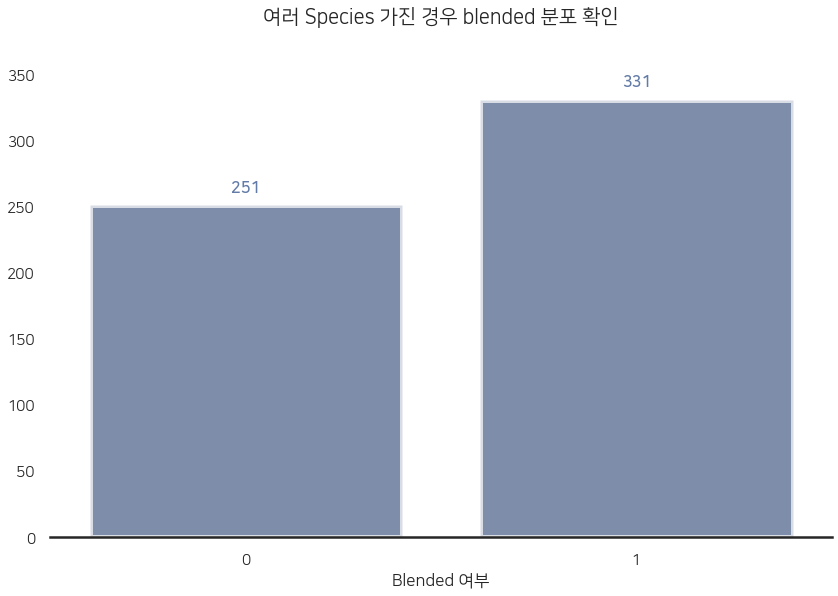

In [120]:
fig15= plt.figure(figsize=(14,9))
fig15.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig15.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig15.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area15= fig15.add_subplot(1,1,1)

area15.set_title('Bean Type Count', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.05))
ax15 = sns.countplot(x='blended', data=df3, linewidth=5, color='#3C5A91', alpha=0.7)
ax15.set_title('여러 Species 가진 경우 blended 분포 확인', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax15.set_xlabel('Blended 여부', fontsize=17)
ax15.set(ylabel=None)

for p in ax15.patches:
  height= p.get_height()
  ax15.text(p.get_x() + p.get_width() /2., height+10, height, ha='center', size=20, color='#3C5A91', alpha=0.8, fontsize=16, weight='bold')
ax15.set_ylim(0,370)

In [121]:
# 원산지나 재배장소가 여러 곳인 경우와 blended 여부는 관련이 없다.

같은 장소에서 재배된 품목과 다른 장소에서 재배된 품목을 비교하려 합니다.

이를 위해 같은 장소에서 재배된 품목에 대한 feature를 생성합니다.

In [122]:
df['bean_born_same'] = np.where(df['species'] != df['bean_origin'], 0, 1)
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0,23,0
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0,23,0
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0,23,0
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0,23,0
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0,23,0


In [123]:
df['bean_born_same'].corr(df['rating'])

-0.11850700485520095

상관계수 수치가 애매하지만 절대값 0.1을 넘으므로 약한 상관관계를 보인다 할 수 있습니다.

Text(0.5, 1.04, '원산지와 재배지 동일 여부에 따른 rating과의 상관성')

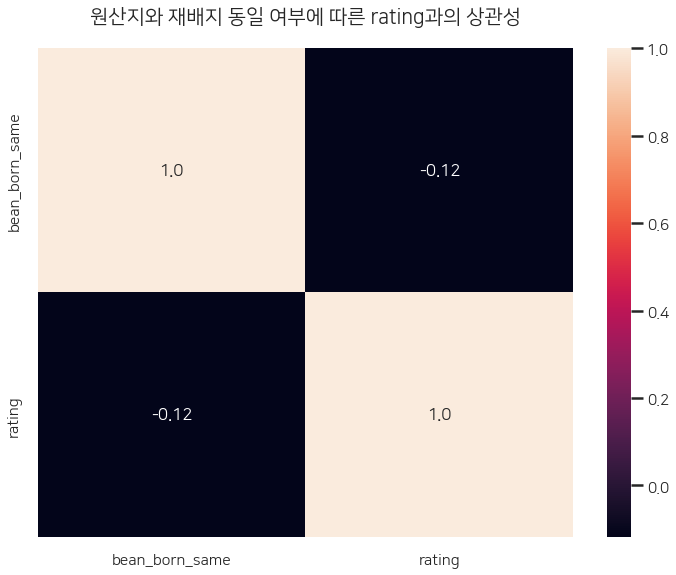

In [124]:
fig16= plt.figure(figsize=(12,9))
fig16.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig16.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig16.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area16= fig16.add_subplot(1,1,1)

area16.set_title('Bean Type Count', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.05))
ax16 = sns.heatmap(df[['bean_born_same','rating']].corr(),annot=True, fmt='.2')
ax16.set_title('원산지와 재배지 동일 여부에 따른 rating과의 상관성', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))

(-0.5, 1.5)

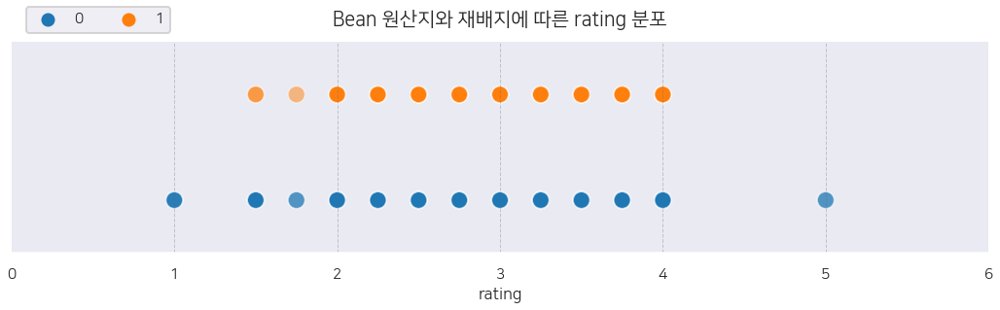

In [125]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig17= plt.figure(figsize=(18,4))
fig17.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig17.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig17.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area17= fig17.add_subplot(1,1,1)

area17.set_title('Bean 원산지와 재배지에 따른 rating 분포', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.05))
ax17 = sns.scatterplot(x='rating',y='bean_born_same', data=df, alpha=0.5, ax=area17, color='#3C5A91', s=300, marker='o',hue='bean_born_same')
ax17.axes.yaxis.set_visible(False) # y축 숫자 안보이게

# 축 설정
plt.axvline(x=1, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axvline(x=2, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axvline(x=3, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axvline(x=4, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axvline(x=5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

# legend 위치 지정
plt.legend(loc='upper_center', bbox_to_anchor=(0+0.17,1+0.2), ncol=2)

# 축 범위 지정
plt.xlim(0.,6)
plt.ylim(-0.5,1.5)

Bean 원산지와 재배지가 같은 경우와 다른 경우 모두 분포가 유사하게 나타나는 것을 확인할 수 있습니다.

그러나 원산지와 재배지가 같은 경우 좀 더 밀집된 형태, 다른 경우는 좀 더 분산된 형태임을 확인할 수 있습니다.

또, 원산지와 재배지가 동일한 경우 다른 경우에서보다 높은 rating에 위치함을 볼 수 있습니다.

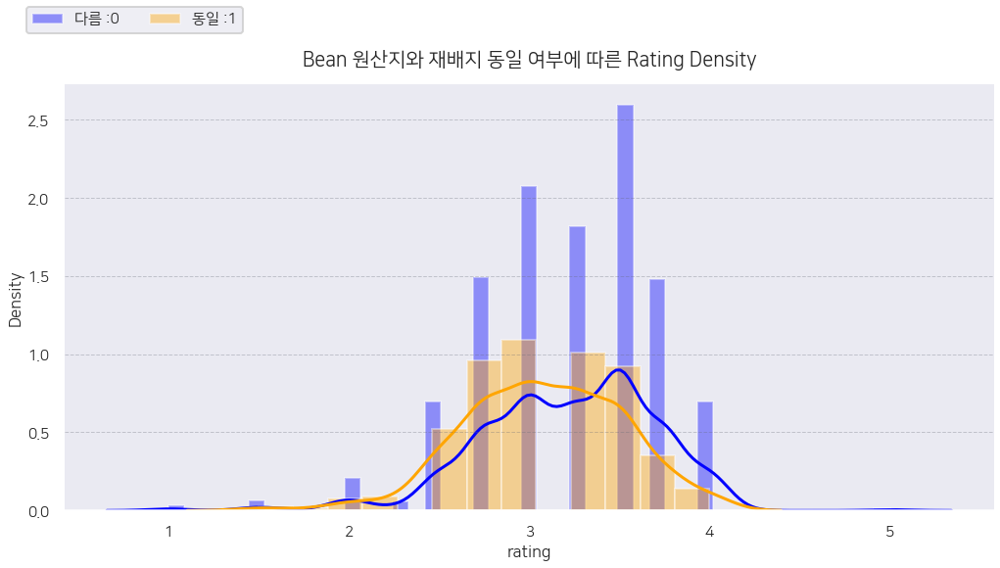

In [126]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig18= plt.figure(figsize=(17,8))
fig18.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig18.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig18.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area18= fig18.add_subplot(1,1,1)

area18.set_title('Bean 원산지와 재배지 동일 여부에 따른 Rating Density', fontsize=65, fontproperties=fontprop, position=(0.5, 1.0+0.03))
ax18 = sns.distplot(df[df.bean_born_same == 0]["rating"], color="b", label="다름 :0")
ax18 = sns.distplot(df[df.bean_born_same == 1]["rating"], color="orange", label="동일 :1")

# 축 설정
plt.axhline(y=0.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=2, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=2.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

# legend 위치 지정
plt.legend(loc='upper_center', bbox_to_anchor=(0+0.2,1+0.2), ncol=2)

1은 bean의 원산지와 재배지가 같은 경우의 rating 추이를 보여줍니다.

0은 bean의 원산지와 재배지가 다른 경우의 rating 추이를 나타내고 있습니다.

원산지와 재배지가 같은 경우와 다른 경우 모두 유사한 rating 분포를 나타내는 것으로 보이며, 

Rating Density를 확인하면 각 범주가 어느 rating을 더 많이 보이는지 확인할 수 있습니다.

재배 장소가 원산지와 다른 경우보다 다른 경우가 만족 이상의 분포를 더욱 보이는 것을 확인할 수 있습니다.

따라서 **재배장소와 원산지가 동일한 경우 rating에 부정적인 영향을 미친다**고 말할 수 있겠습니다.

In [127]:
# 재배 장소와 원산지가 같은 경우가 rating에 부정적인 영향을 미친다. (귀무가설 기각. 대립가설)

**H0: 특정 지역의 원산지에서 나는 초콜릿이 rating이 높다.**

bean_origin과 rating이 담긴 데이터프레임을 준비했습니다.

In [128]:
origin_rating_df= df[['bean_origin','rating']]
origin_rating_df

,bean_origin,rating
0,Sao Tome,3.75
1,Togo,2.75
2,Togo,3.00
3,Togo,3.50
4,Peru,3.50
...,...,...
1790,Peru,3.75
1791,Congo,3.00
1792,India,3.50
1793,India,3.25


원산지가 기록되지 않은 항은 분석 범위에서 제거하도록 하겠습니다.

In [129]:
origin_rating_df = origin_rating_df[origin_rating_df.bean_origin != '']

In [130]:
rating_origin = origin_rating_df.groupby('bean_origin').mean().T

bean 원산지에 따른 rating의 평균은 다음과 같습니다.

모든 rating은 2~4 사이에 위치합니다.

Text(0.5, 1.05, 'bean 원산지에 따른 rating')

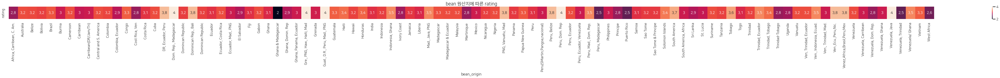

In [131]:
fig19= plt.figure(figsize=(90,1))
fig19.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig19.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig19.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area19= fig19.add_subplot(1,1,1)

ax19 = sns.heatmap(rating_origin, annot=True)
ax19.set_title('bean 원산지에 따른 rating', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.05))

위의 heatmap의 수치는 2와 4 사이에 위치합니다.

이 수치를 평균 0 분산 1 사이로 맞춰 다시 확인해보겠습니다.

In [132]:
# 평균 0 분산 1로 맞춰주기 위해 rating에 -3을 취해줬습니다. (-1 ~ 1)
origin_rating_df['scaled_rating']= origin_rating_df['rating']-3

# bean_origin에 따른 평균으로 묶어줍니다. # Transpose
origin_rating_df = origin_rating_df.groupby('bean_origin').mean().T

Text(0.5, 1.07, 'bean 원산지에 따른 rating')

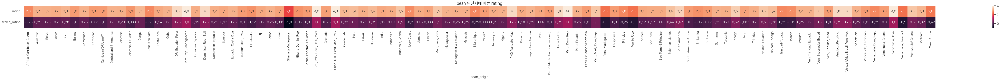

In [133]:
fig20= plt.figure(figsize=(100,2))
fig20.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig20.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig20.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area20= fig20.add_subplot(1,1,1)

ax20 = sns.heatmap(origin_rating_df, annot=True, fmt='.2')
ax20.set_title('bean 원산지에 따른 rating', fontsize=80, fontproperties=fontprop, position=(0.5, 1.0+0.07))

Rating과 Bean 원산지 사이의 상관관계

품목이 많기 때문에 뚜렷한 양적 상관관계를 보이는 항목과 강한 양적 상관관계를 보이는 부분만 정리해보겠습니다.


- 양적 상관관계
  - 강한 양적 상관관계 (0.7~1.0): 
      - DR, Ecuador, Peru
      - Dominican Rep., Bali
      - Gre., RNG, Haw., Haiti, Mad
      - Guat., DR., Peru, Mad., PNG
      - PNG, Vamaiatu, Mad
      - Peru, Belize
      - Ven., Ecu., Peru, Nic.
      - Venez,Africa,Brasil,Peru,Mex
      - Venezuela, Java

  - 뚜렷한 양적 상관관계(0.3~0.7)
      - Congo
      - Guatemala
      - Haiti
      - Honduras
      - Indonesia Ghana
      - Mad, Java, PNG
      - Tobago
      - Trinidad, Ecuador
      - Trinidad, Tobago



추가적으로 **Bean들의 상관관계**를 볼 수 있을 것입니다.

열을 n-1로 제한하지 않고 모든 열에 대해 적용시키겠습니다.

In [134]:
origin_rating_df2 = df[['bean_origin','rating']]
origin_rating_df2 = origin_rating_df2[origin_rating_df2.bean_origin != '']

In [135]:
origin_rating_df2 = pd.get_dummies(origin_rating_df2, columns=['bean_origin']) # N-1개 열 생성시 drop_first=True
print(f'one hot encoding 후 shape : {origin_rating_df2.shape}')
origin_rating_df2 = origin_rating_df2.sort_values(by='rating')
origin_rating_df2 = origin_rating_df2.groupby('rating').mean()
print(f'rating으로 묶어준 후 shape: {origin_rating_df2.shape}\n')
origin_rating_df2 = origin_rating_df2.reset_index()
origin_rating_df2

one hot encoding 후 shape : (1720, 99)
rating으로 묶어준 후 shape: (13, 98)



,rating,"bean_origin_Africa, Carribean, C. Am.",bean_origin_Australia,bean_origin_Belize,bean_origin_Bolivia,bean_origin_Brazil,bean_origin_Burma,bean_origin_Cameroon,bean_origin_Carribean,bean_origin_Carribean(DR/Jam/Tri),bean_origin_Central and S. America,bean_origin_Colombia,"bean_origin_Colombia, Ecuador",bean_origin_Congo,"bean_origin_Cost Rica, Ven",bean_origin_Costa Rica,bean_origin_Cuba,"bean_origin_DR, Ecuador, Peru","bean_origin_Dom. Rep., Madagascar",bean_origin_Domincan Republic,"bean_origin_Dominican Rep., Bali",bean_origin_Dominican Republic,bean_origin_Ecuador,"bean_origin_Ecuador, Costa Rica","bean_origin_Ecuador, Mad., PNG",bean_origin_El Salvador,bean_origin_Fiji,bean_origin_Gabon,bean_origin_Ghana,bean_origin_Ghana & Madagascar,"bean_origin_Ghana, Domin. Rep","bean_origin_Ghana, Panama, Ecuador","bean_origin_Gre., PNG, Haw., Haiti, Mad",bean_origin_Grenada,"bean_origin_Guat., D.R., Peru, Mad., PNG",bean_origin_Guatemala,bean_origin_Haiti,bean_origin_Hawaii,bean_origin_Honduras,bean_origin_India,...,"bean_origin_Peru, Dom. Rep","bean_origin_Peru, Ecuador","bean_origin_Peru, Ecuador, Venezuela","bean_origin_Peru, Mad., Dom. Rep.","bean_origin_Peru, Madagascar",bean_origin_Philippines,bean_origin_Principe,bean_origin_Puerto Rico,bean_origin_Samoa,bean_origin_Sao Tome,bean_origin_Sao Tome & Principe,bean_origin_Solomon Islands,bean_origin_South America,"bean_origin_South America, Africa",bean_origin_Sri Lanka,bean_origin_St. Lucia,bean_origin_Suriname,bean_origin_Tanzania,bean_origin_Tobago,bean_origin_Togo,bean_origin_Trinidad,"bean_origin_Trinidad, Ecuador","bean_origin_Trinidad, Tobago",bean_origin_Trinidad-Tobago,bean_origin_Uganda,bean_origin_Vanuatu,"bean_origin_Ven, Trinidad, Ecuador","bean_origin_Ven., Indonesia, Ecuad.","bean_origin_Ven., Trinidad, Mad.","bean_origin_Ven.,Ecu.,Peru,Nic.","bean_origin_Venez,Africa,Brasil,Peru,Mex",bean_origin_Venezuela,"bean_origin_Venezuela, Carribean","bean_origin_Venezuela, Dom. Rep.","bean_origin_Venezuela, Ghana","bean_origin_Venezuela, Java","bean_origin_Venezuela, Trinidad",bean_origin_Venezuela/ Ghana,bean_origin_Vietnam,bean_origin_West Africa
0,1.00,0.000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000,0.000000,0.00000,0.000000,0.500000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000
1,1.50,0.000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.600000,0.000000,0.00000,0.00000,0.000000,0.000000,0.200000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000
2,1.75,0.000,0.000000,0.000000,0.000000,0.333333,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000

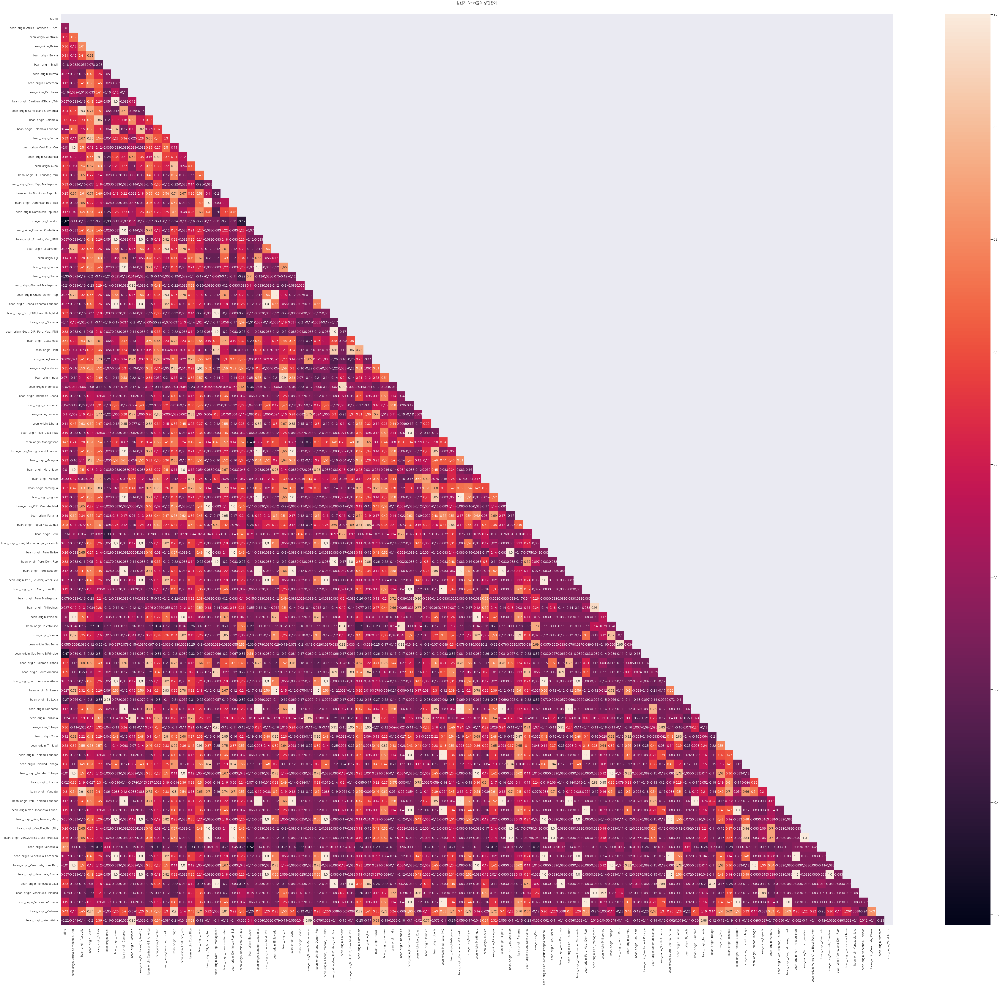

In [136]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig21= plt.figure(figsize=(100,90))
fig21.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig21.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig21.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area21= fig21.add_subplot(1,1,1)

upp_mat_obean = np.triu(origin_rating_df2.corr())
area21.set_title('원산지 Bean들의 상관관계', fontsize=65, fontproperties=fontprop, position=(0.5, 1.0+0.01))
ax21 = sns.heatmap(origin_rating_df2.corr(),annot=True, fmt='.2', mask=upp_mat_obean)
#fig21.savefig('bean_relation_heatmap.png')

bean들에 대한 상관관계를 보다 명확하게 볼 수 있도록 clustermap을 통해 시각화하였습니다.

하위 부분이 가장 유사한 종류로 묶은 것이며 순차적으로 결합됩니다.

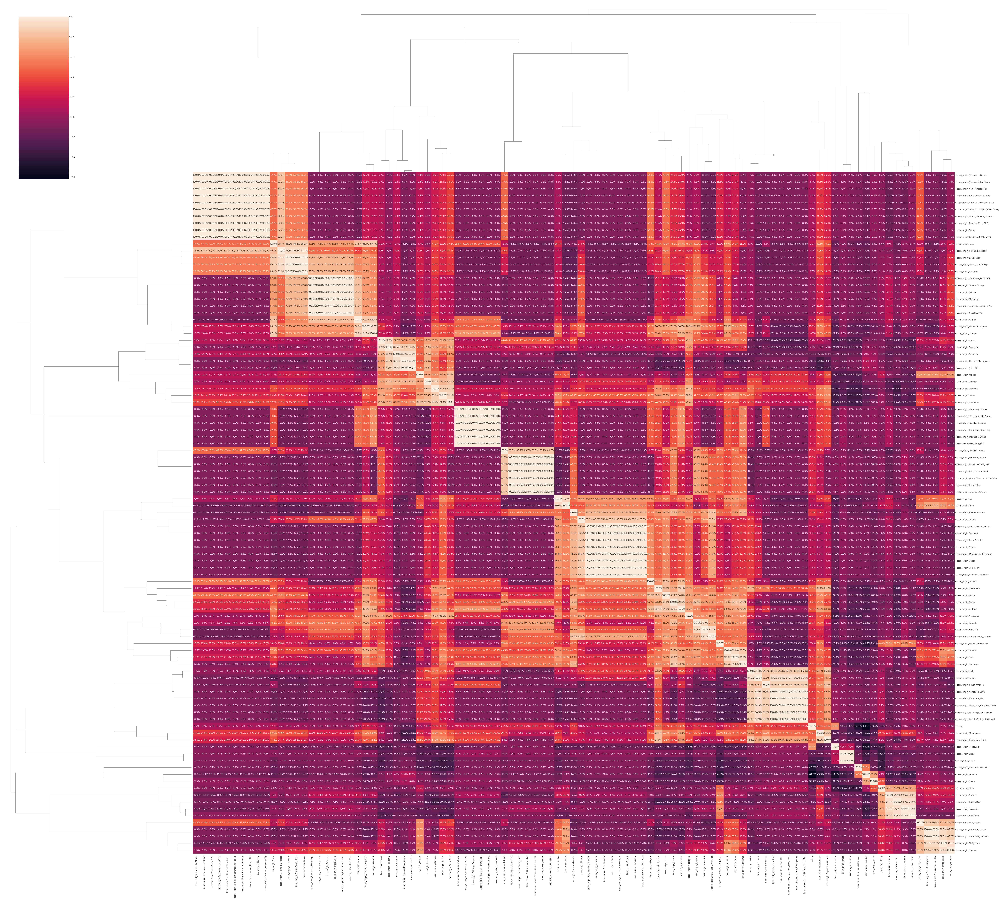

In [137]:
ax22= sns.clustermap(origin_rating_df2.corr(),annot=True, fmt='.1%', metric='correlation', figsize=(100,90))
#ax22.savefig('bean_cluster.png')

### 3.Cacao 함류량

In [138]:
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0,23,0
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0,23,0
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0,23,0
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0,23,0
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0,23,0


In [139]:
df.cacao_percent.nunique()

45

In [140]:
cacao_use_df = pd.DataFrame(df.cacao_percent.value_counts(normalize=True)*100)
cacao_use_df.T.style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,70.0,75.0,72.0,65.0,80.0,74.0,68.0,60.0,73.0,85.0,64.0,77.0,71.0,67.0,76.0,66.0,100.0,82.0,78.0,55.0,62.0,63.0,69.0,90.0,61.0,88.0,58.0,81.0,83.0,84.0,72.5,91.0,56.0,73.5,99.0,89.0,53.0,46.0,60.5,57.0,79.0,86.0,50.0,42.0,87.0
cacao_percent,37.423313,12.381484,10.485220,4.350251,4.015616,2.788622,2.621305,2.398215,2.230898,2.007808,1.896263,1.840491,1.728946,1.505856,1.282766,1.282766,1.115449,0.948132,0.948132,0.892359,0.780814,0.669269,0.557724,0.446180,0.446180,0.446180,0.446180,0.278862,0.223090,0.223090,0.223090,0.167317,0.111545,0.111545,0.111545,0.111545,0.055772,0.055772,0.055772,0.055772,0.055772,0.055772,0.055772,0.055772,0.055772


Cacao Percent 사용률 Top10 입니다.

In [141]:
cacao_use_df.head(10).style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,cacao_percent
70.0,37.423313
75.0,12.381484
72.0,10.485220
65.0,4.350251
80.0,4.015616
74.0,2.788622
68.0,2.621305
60.0,2.398215
73.0,2.230898
85.0,2.007808


카카오 퍼센트 70이 37%로 가장 많은 비율을 차지하고 있고, 두 번째인 75%보다 3배 높은 추이를 보입니다.

카카오 퍼센트 70, 75, 72%의 사용이 두드러지게 보입니다.

(0.0, 0.35)

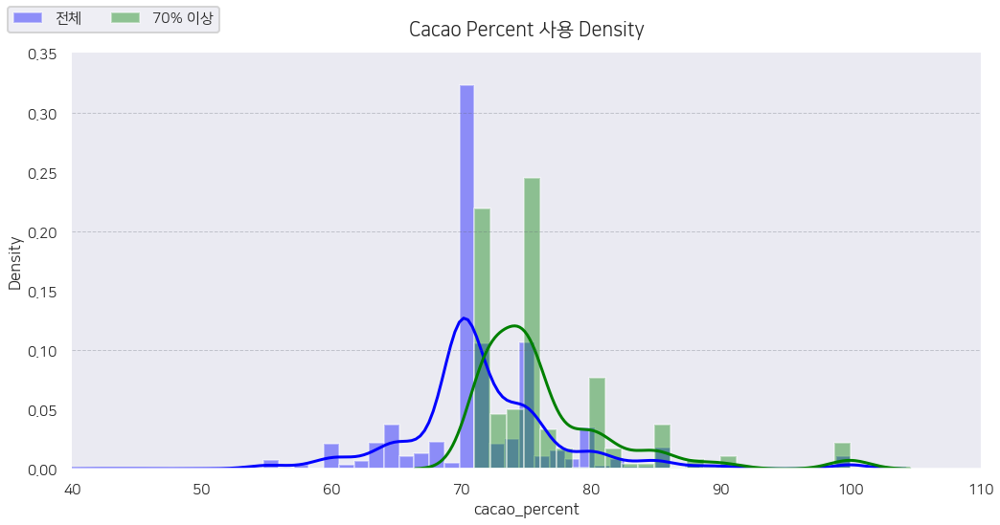

In [142]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig23= plt.figure(figsize=(17,8))
fig23.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig23.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig23.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area23= fig23.add_subplot(1,1,1)

area23.set_title('Cacao Percent 사용 Density', fontsize=65, fontproperties=fontprop, position=(0.5, 1.0+0.03))
ax23 = sns.distplot(df.cacao_percent, color="b", label="전체")
ax24 = sns.distplot(df[df.cacao_percent > 70]["cacao_percent"], color="g", label="70% 이상")

# 축 설정
plt.axhline(y=0.1, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=0.2, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=0.3, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=0.4, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

# legend 위치 지정
plt.legend(loc='upper_center', bbox_to_anchor=(0+0.17,1+0.13), ncol=2)

# 축 범위 지정
plt.xlim(40,110)
plt.ylim(0,0.35)

카카오 70% 이상을 봤을 때 75%, 72%에 이어 80%가 다음을 차지합니다.

만약 고함량 카카오 초콜릿을 타겟으로 잡는다면 70 - 75 - 80 순으로 많이 사용한다는 것을 참고할 수 있겠습니다.


   ----

다음으로 카카오 사용률과 rating은 상관관계가 있는지

카카오 퍼센트와 rating의 상관성이 있는지 살펴보도록 하겠습니다.

전체 데이터셋에서 카카오 퍼센트의 사용량에 따라 해당 카카오 퍼센트의 사용빈도를 나타내는 c_count feature를 형성하겠습니다.

In [143]:
df['c_count'] = df.groupby('cacao_percent')['cacao_percent'].transform('count')
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same,c_count
0,A. Morin,Agua Grande,1876,2016,63.0,France,3.75,,Sao Tome,1,0,23,0,12
1,A. Morin,Kpime,1676,2015,70.0,France,2.75,,Togo,1,0,23,0,671
2,A. Morin,Atsane,1676,2015,70.0,France,3.00,,Togo,1,0,23,0,671
3,A. Morin,Akata,1680,2015,70.0,France,3.50,,Togo,1,0,23,0,671
4,A. Morin,Quilla,1704,2015,70.0,France,3.50,,Peru,1,0,23,0,671


카카오 사용 빈도와 rating은 약한 양의 상관관계를 보입니다.

즉, 동일한 카카오 비중을 많이 사용하는 것이 rating에 영향을 준다는 것입니다.

In [144]:
df['c_count'].corr(df['rating'])

0.1572823281829453

**카카오 함류량 평균 rating Top10**

In [145]:
cacao_df = df.groupby('cacao_percent').mean()
cacao_df.sort_values(by='rating', ascending=False).head(10)

,REF,review_year,rating,blended,g_count,bean_born_same,c_count
cacao_percent,,,,,,,
50.0,572.000000,2010.000000,3.750000,1.000000,5.000000,0.000000,1.0
63.0,1059.833333,2012.416667,3.604167,0.416667,10.500000,0.416667,12.0
69.0,935.500000,2012.000000,3.500000,0.400000,15.800000,0.000000,10.0
66.0,802.391304,2011.130435,3.380435,0.521739,7.956522,0.260870,23.0
67.0,956.000000,2011.851852,3.351852,0.629630,8.259259,0.222222,27.0
78.0,1244.529412,2013.411765,3.338235,0.764706,8.470588,0.117647,17.0
68.0,989.468085,2012.148936,3.287234,0.595745,7.553191,0.212766,47.0
70.0,1162.488823,2012.980626,3.274963,0.467958,10.938897,0.210134,671.0
87.0,785.000000,2011.000000,3.250000,0.000000,4.000000,0.000000,1.0


카카오 퍼센트별로 묶은 데이터프레임을 다시 형성해주었었습니다.

In [146]:
cacao_df2 = cacao_df.reset_index()
cacao_df2.head()

,cacao_percent,REF,review_year,rating,blended,g_count,bean_born_same,c_count
0,42.0,1149.0,2013.0,2.750000,0.0,1.0000,0.0000,1.0
1,46.0,552.0,2010.0,2.750000,0.0,4.0000,0.0000,1.0
2,50.0,572.0,2010.0,3.750000,1.0,5.0000,0.0000,1.0
3,53.0,32.0,2006.0,2.000000,1.0,5.0000,0.0000,1.0
4,55.0,629.5,2010.5,2.859375,0.5,4.6875,0.3125,16.0


카카오 퍼센트에 따른 사용 빈도를 시각화 한 모습은 다음과 같습니다.

전반적으로 고르게 사용되지만 카카오 퍼센트 70과 70부근에서 사용 빈도가 눈에 띄게 늘어나는 것을 확인할 수 있습니다.

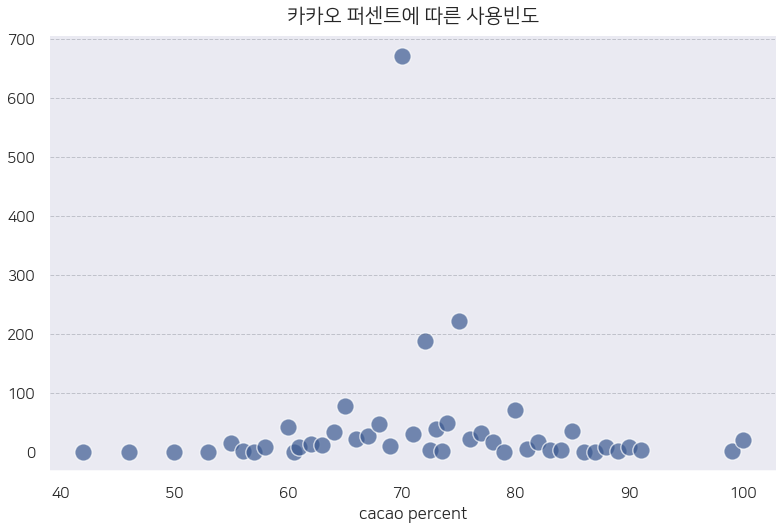

In [147]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig25= plt.figure(figsize=(13,8))
fig25.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig25.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig25.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area25= fig25.add_subplot(1,1,1)

area25.set_title('카카오 퍼센트에 따른 사용빈도', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax25 = sns.scatterplot(x="cacao_percent", y="c_count", data=cacao_df2, alpha=0.7, ax=area25, color='#3C5A91', s=300, marker='o')
ax25.set_xlabel('cacao percent', fontsize=17)
ax25.set(ylabel=None)

# 축 설정
plt.axhline(y=100, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=200, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=300, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=400, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=500, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=600, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=700, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

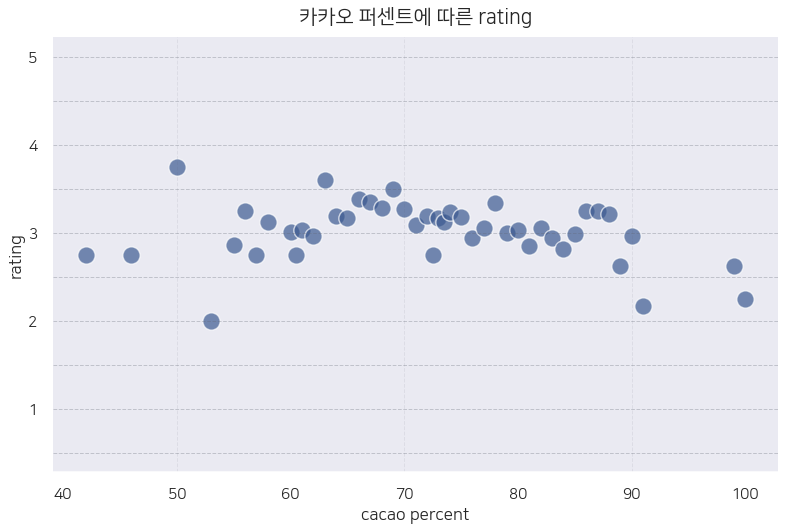

In [148]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig26= plt.figure(figsize=(13,8))
fig26.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig26.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig26.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area26= fig26.add_subplot(1,1,1)

area26.set_title('카카오 퍼센트에 따른 rating', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax26 = sns.scatterplot(x="cacao_percent", y="rating", data=cacao_df2, alpha=0.7, ax=area26, color='#3C5A91', s=300, marker='o')
ax26.set_xlabel('cacao percent', fontsize=17)
ax26.set_ylabel('rating', fontsize=17)

# y축 설정
plt.axhline(y=0.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=2, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=2.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=4, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=4.5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=5, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

# x축 설정
plt.axvline(x=50, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=70, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=90, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

In [149]:
cacao_df2.cacao_percent.corr(cacao_df2.rating)

-0.1913790773481016

약한 음의 상관관계를 갖고 있음을 확인할 수 있습니다.

이는 카카오 함량을 높일수록 rating에 좋지 않은 영향을 보일 수 있음을 의미합니다.

In [150]:
# 70%의 카카오 함량을 가장 많이 사용하며 카카오 함량이 높을수록 rating은 적게 나타납니다.

### 4.REF & review year 비교

In [151]:
df = df.sort_values(by='review_year')           # review year에 따라 올림차순 정렬

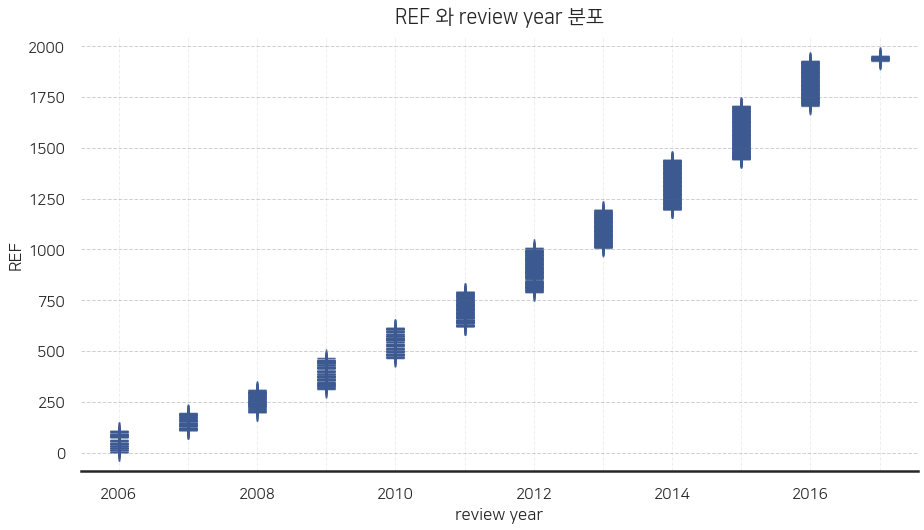

In [152]:
sns.set_style('white',{'font.family':'NanumSquare'})

fig27= plt.figure(figsize=(15,8))
fig27.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig27.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig27.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area27= fig27.add_subplot(1,1,1)

area27.set_title('REF 와 review year 분포', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax27 = sns.scatterplot(x="review_year", y="REF", data=df, alpha=0.7, ax=area27, color='#3C5A91', s=300, marker='+')
ax27.set_xlabel('review year', fontsize=17)
ax27.set_ylabel('REF', fontsize=17)

# y축 설정
plt.axhline(y=0, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=250, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=500, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=750, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1000, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1250, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1500, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=1750, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=2000, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

# x축 설정
plt.axvline(x=2006, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2007, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2008, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2009, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2010, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2011, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2012, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2013, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2014, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2015, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2016, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2017, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

리뷰가 작성된 연도에 따라 REF가 증가하는 추세임을 확인하였습니다.

다음으로 review year와 REF가 rating과 어떤 상관관계를 가지는지 확인하도록 하겠습니다.

In [153]:
df.review_year.corr(df.rating)

0.10033223746943844

In [154]:
df.REF.corr(df.rating)

0.10174724056878802

review year와 REF 모두 0.1을 넘어서긴 하지만 굉장히 근소하기 때문에 rating과 약한 상관관계를 가집니다.

**연도에 따른 REF 개수**

review year에 따라 REF의 개수를 세서 REF_count feature를 만들어주었습니다.

In [155]:
df['REF_count'] = df.groupby('review_year')['REF'].transform('count')
df.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same,c_count,REF_count
1177,Neuhaus (Callebaut),Sao Tome,15,2006,75.0,Belgium,2.75,Forastero,Sao Tome,2,1,6,1,222,72
1292,Pierre Marcolini,"Porcelana, Tabasco, Limited Ed.",81,2006,72.0,Belgium,4.00,Criollo,Mexico,2,1,14,0,188,72
1237,Original Hawaiin Chocolate Factory,"Hawai'i, Kona Estate Grown",24,2006,60.0,U.S.A.,3.00,,Hawaii,1,0,2,0,43,72
1178,Neuhaus (Callebaut),Ocumare,24,2006,71.0,Belgium,3.00,Criollo,Venezuela,2,1,6,0,31,72
1176,Neuhaus (Callebaut),West Africa,15,2006,73.0,Belgium,2.00,Forastero,West Africa,2,1,6,1,40,72


In [156]:
review_yr_df = df.groupby('review_year').mean()
review_yr_df.style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,REF,cacao_percent,rating,blended,g_count,bean_born_same,c_count,REF_count
review_year,,,,,,,,
2006,54.375000,71.000000,3.125000,0.805556,16.722222,0.125000,217.666667,72.000000
2007,151.155844,72.038961,3.162338,0.792208,11.545455,0.298701,269.558442,77.000000
2008,256.086022,72.698925,2.994624,0.666667,9.978495,0.161290,267.000000,93.000000
2009,389.585366,70.443089,3.073171,0.642276,11.414634,0.203252,253.552846,123.000000
2010,540.306306,70.779279,3.148649,0.477477,9.315315,0.297297,217.819820,111.000000
2011,703.957317,70.975610,3.251524,0.493902,11.798780,0.231707,266.469512,164.000000
2012,900.185567,71.525773,3.181701,0.474227,10.721649,0.195876,333.309278,194.000000
2013,1101.152174,72.266304,3.197011,0.429348,11.891304,0.255435,328.315217,184.000000
2014,1319.165992,72.253036,3.189271,0.497976,7.866397,0.283401,333.032389,247.000000


In [157]:
# review_year를 feature로 다시 만들어줍니다.
review_yr_df = review_yr_df.reset_index()

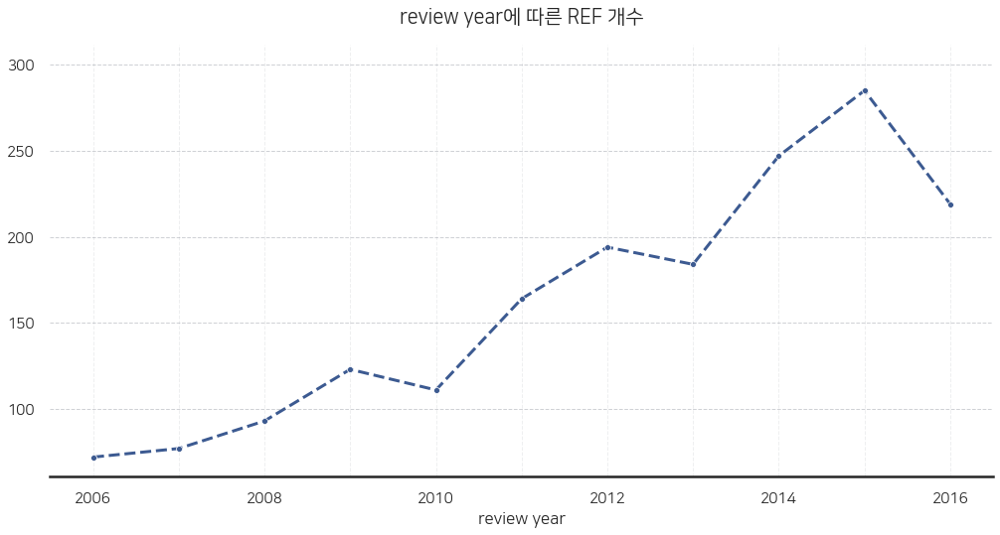

In [158]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig28= plt.figure(figsize=(17,8))
fig28.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig28.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig28.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area28= fig28.add_subplot(1,1,1)

ax28=sns.lineplot(x= 'review_year',y='REF_count',data=review_yr_df.iloc[:-1,:], color='#3C5A91', ax=area28, marker='.', linestyle='--')
ax28.set_title('review year에 따른 REF 개수', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax28.set_xlabel('review year', fontsize=17)
ax28.set(ylabel=None)

# y축 설정
plt.axhline(y=100, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=150, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=200, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=250, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=300, color='#626774', linestyle='--', linewidth=1, alpha=0.3)

# x축 설정
plt.axvline(x=2006, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2007, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2008, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2009, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2010, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2011, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2012, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2013, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2014, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2015, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2016, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

2017년의 데이터셋은 작성중이었던 것으로 판단된다.

정확한 추이를 알 수 없기 때문에 2017년의 REF 개수는 고려하지 않았다.

위 그래프를 볼 때 2010, 2013,2016년 잠시 REF의 개수가 줄어드는 것으로 보이나 전반적으로는 증가하는 추세임을 확인할 수 있다.

### **5.review year & rating**

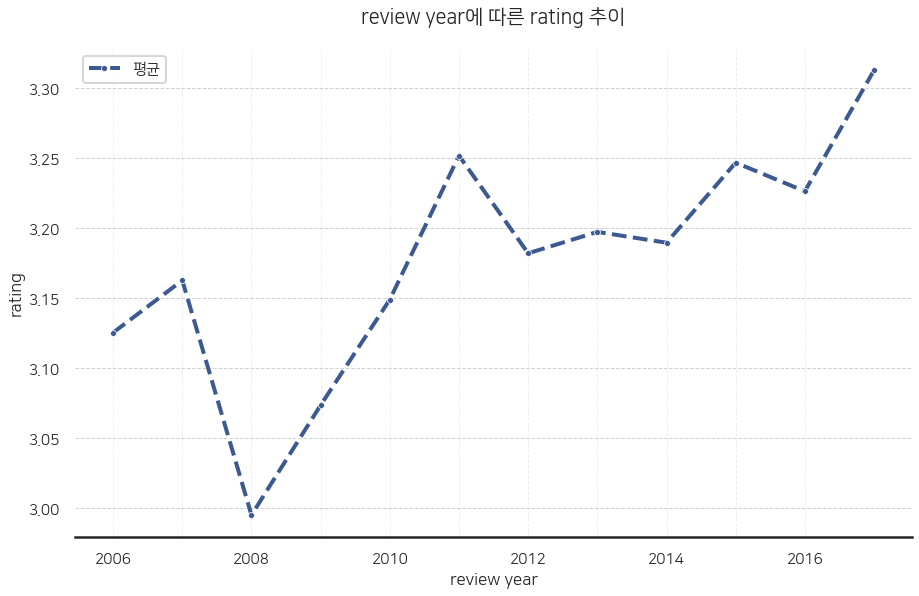

In [159]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig30= plt.figure(figsize=(15,9))
fig30.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig30.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig30.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area30= fig30.add_subplot(1,1,1)

ax30=sns.lineplot(x= 'review_year',y='rating',data=review_yr_df, color='#3C5A91', ax=area30, marker='.', linestyle='--', label='평균', linewidth=4)

ax30.set_title('review year에 따른 rating 추이', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax30.set_xlabel('review year', fontsize=17)
ax30.set_ylabel('rating', fontsize=17)

# y축 설정
plt.axhline(y=3.0, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.05, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.1, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.15, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.2, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.25, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=3.3, color='#626774', linestyle='--', linewidth=1, alpha=0.3)


# x축 설정
plt.axvline(x=2006, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2007, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2008, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2009, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2010, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2011, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2012, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2013, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2014, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2015, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2016, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

- 2008년 : 급격한 rating의 하락세
- 2011년 : rating 상승세의 정점

  ---

  2008년과 2011년의 추이를 살펴볼 수 있을 것 같습니다.

**2008**

In [160]:
df_2008 = df[df.review_year==2008]
print(f'2008년에 해당하는 데이터셋은 총 {df_2008.shape[0]} 입니다.\n')
df_2008.head()

2008년에 해당하는 데이터셋은 총 93 입니다.



,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same,c_count,REF_count
207,Bittersweet Origins,Puerto Plata,233,2008,68.0,U.S.A.,3.75,,Dominican Republic,1,0,14,0,47,93
208,Bittersweet Origins,Ankasa,256,2008,70.0,U.S.A.,3.00,Forastero,Ghana,2,1,14,0,671,93
530,Debauve & Gallais (Michel Cluizel),Venezuela,263,2008,66.0,France,3.75,,Venezuela,1,0,2,1,23,93
210,Black Mountain,Carenero Superior,256,2008,70.0,U.S.A.,2.75,Trinitario,Venezuela,2,1,3,0,671,93
211,Black Mountain,Matiguas,256,2008,70.0,U.S.A.,3.00,,Nicaragua,1,0,3,0,671,93


In [161]:
df_2008.species.nunique()

70

2008년 재배 원산지는 총 70곳이며 Top10은 아래와 같습니다.

In [162]:
round((df_2008.species.value_counts(normalize=True)*100),2).head(10)

Esmeraldas              6.45
Los Rios                4.30
Madagascar              4.30
Ocumare                 4.30
Carenero Superior       3.23
Manabi                  3.23
Cacao Nacional W.F.     2.15
Raw                     2.15
Africa                  2.15
Porcelana, Venezuela    2.15
Name: species, dtype: float64

In [163]:
df_2008.cacao_percent.corr(df_2008.rating)

-0.4229435956407854

In [164]:
df_2008.rating.mean()

2.9946236559139785

In [165]:
df_2008.bean_type.value_counts()

                           31
Forastero                  30
Trinitario                 16
Criollo                    11
Blend                       4
Blend-Forastero,Criollo     1
Name: bean_type, dtype: int64

In [166]:
df_2008.bean_type.value_counts()[1:]

Forastero                  30
Trinitario                 16
Criollo                    11
Blend                       4
Blend-Forastero,Criollo     1
Name: bean_type, dtype: int64

[Text(0, 0.5, '')]

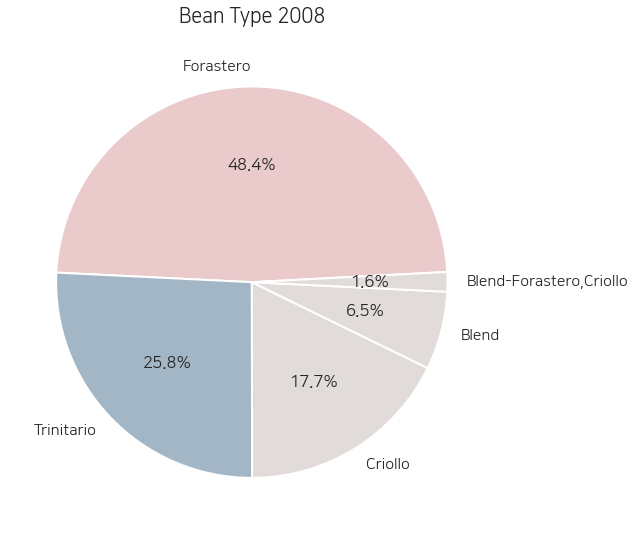

In [167]:
fig, ax = plt.subplots(1,1, figsize=(9,9)) 
colors = ['#EACACB','#A3B6C5', '#E1DCD9','#E1DCD9','#E1DCD9']
df_2008.bean_type.value_counts()[1:].plot.pie(explode=[0.0, 0.0, 0.0, 0.0, 0.0],autopct='%1.1f%%',ax=ax,shadow=False,startangle=3, colors= colors)
ax.set_title('Bean Type 2008',fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.02))
ax.set(xlabel=None)
ax.set(ylabel=None)

In [168]:
df_2008.company.nunique()

35

In [169]:
round((df_2008.company.value_counts(normalize=True)*100),2).head(10)

Kallari (Ecuatoriana)         8.60
Caoni (Tulicorp)              6.45
Pacari                        5.38
Bittersweet Origins           4.30
Domori                        4.30
Cacaoyere (Ecuatoriana)       4.30
Rogue                         4.30
Salgado                       4.30
Hotel Chocolat (Coppeneur)    4.30
Maglio                        4.30
Name: company, dtype: float64

In [170]:
df_2011 = df[df.review_year ==2011]
print(f'2011년에 해당하는 데이터셋은 총 {df_2011.shape[0]} 입니다.\n')
df_2011.head()

2011년에 해당하는 데이터셋은 총 164 입니다.



,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same,c_count,REF_count
1003,Madre,Upala,693,2011,70.0,U.S.A.,2.75,,Costa Rica,1,0,11,0,671,164
1002,Madre,Dominican,672,2011,70.0,U.S.A.,2.50,,Dominican Republic,1,0,11,0,671,164
232,Bonnat,"Madagascar, 100% criollo",629,2011,75.0,France,4.00,Criollo,Madagascar,2,1,27,0,222,164
233,Bonnat,Juliana,672,2011,75.0,France,3.50,,Brazil,1,0,27,0,222,164
234,Bonnat,Jamaique,761,2011,75.0,France,3.25,Trinitario,Jamaica,2,1,27,0,222,164


In [171]:
df_2011.species.nunique()

133

In [172]:
df_2011.cacao_percent.corr(df_2011.rating)

-0.02271291852944078

In [173]:
df_2011.rating.mean()

3.2515243902439024

In [174]:
df_2008_species = set(df_2008.species)
df_2011_species = set(df_2011.species)
species_inter = df_2011_species.intersection(df_2008_species)
len(species_inter)

15

In [175]:
species_inter = list(species_inter)

2008년에는 70곳의 bean 재배지가 있었고, 2011년에는 133 곳의 bean 재배지가 있습니다.

2008년과 2011년 겹치는 재배지는 총 15곳 입니다.

**2008년의 추이 : 재배지 겹치는 곳과 겹치지 않는 곳**

In [176]:
# 2008년과 재배지 겹치는 곳 
species_inter_2008 = df_2008.loc[df_2008.species.isin(species_inter)]
# 2008년 재배지 안겹치는 곳
species_differ_2008 = df_2008.loc[~df_2008.species.isin(species_inter)]

In [177]:
print(f'2008년 기준 겹치는 곳에 대한 데이터는 총 {species_inter_2008.shape[0]} 개 입니다.')
print(f'2008년 기준 겹치지 않는 곳은 총 {species_differ_2008.shape[0]} 개 입니다.')

2008년 기준 겹치는 곳에 대한 데이터는 총 24 개 입니다.
2008년 기준 겹치지 않는 곳은 총 69 개 입니다.


In [178]:
species_inter_2008.head()

,company,species,REF,review_year,cacao_percent,company_location,rating,bean_type,bean_origin,bean_num,blended,g_count,bean_born_same,c_count,REF_count
530,Debauve & Gallais (Michel Cluizel),Venezuela,263,2008,66.0,France,3.75,,Venezuela,1,0,2,1,23,93
210,Black Mountain,Carenero Superior,256,2008,70.0,U.S.A.,2.75,Trinitario,Venezuela,2,1,3,0,671,93
209,Black Mountain,La Red,256,2008,70.0,U.S.A.,2.75,,Dominican Republic,1,0,3,0,671,93
205,Bittersweet Origins,Sambirano,233,2008,71.0,U.S.A.,3.00,Trinitario,Madagascar,2,1,14,0,31,93
286,Cacao Barry,Tanzania,300,2008,75.0,France,2.00,,Tanzania,1,0,5,1,222,93


In [179]:
species_inter_2008.cacao_percent.corr(species_inter_2008.rating)

-0.7497702169218361

In [180]:
species_differ_2008.cacao_percent.corr(species_differ_2008.rating)

-0.31978459115695035

2008년의 카카오 퍼센트와 rating을 2011년과 재배지가 겹치는 곳과 겹치지 않는 곳으로 나눠 살펴보았습니다.

bean 재배지가 겹치는 곳은 rating과의 강한 음적 상관관계를 가지며, 재배지가 상이한 곳은 rating과 뚜렷한 음적 상관관계를 가집니다.

In [181]:
inter2008_rating = pd.DataFrame(species_inter_2008.rating.describe())
differ2008_rating = pd.DataFrame(species_differ_2008.rating.describe())
rating_2008 = pd.concat([inter2008_rating,differ2008_rating],axis=1)
rating_2008 = rating_2008.reset_index()
rating_2008.columns = ['index','inter','differ']
rating_2008 = rating_2008.iloc[1:,:]  # count 제외
rating_2008.style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,index,inter,differ
1,mean,3.104167,2.956522
2,std,0.663147,0.496229
3,min,1.000000,1.500000
4,25%,2.750000,2.750000
5,50%,3.125000,3.000000
6,75%,3.500000,3.250000
7,max,4.000000,4.000000


(0.0, 4.5)

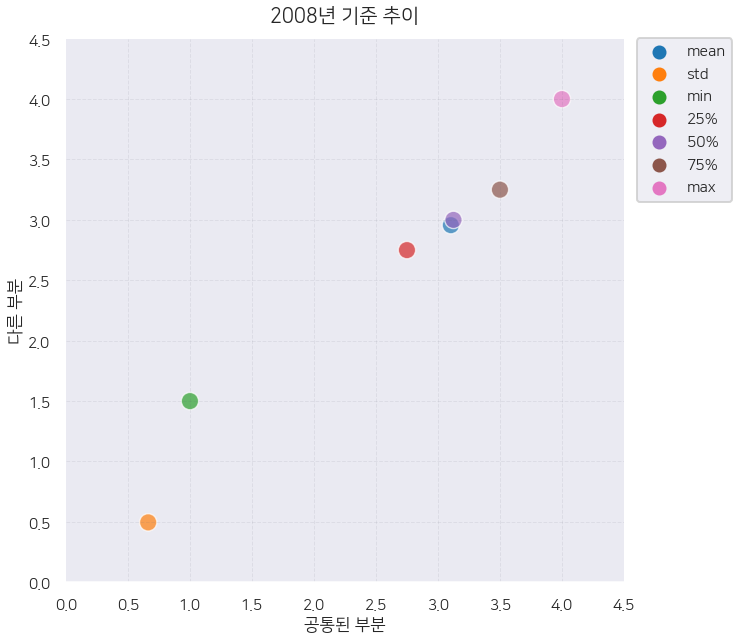

In [182]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig31= plt.figure(figsize=(10,10))
fig31.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig31.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig31.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area31= fig31.add_subplot(1,1,1)

area31.set_title('2008년 기준 추이', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax31 = sns.scatterplot(x="inter", y="differ", data=rating_2008, alpha=0.7, ax=area31, color='#3C5A91', s=300, marker='o', hue='index')
ax31.set_xlabel('공통된 부분', fontsize=17)
ax31.set_ylabel('다른 부분', fontsize=17)

# y축 설정
plt.axhline(y=0.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=1.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=1.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=2.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=2.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=3.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=3.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=4.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)


# x축 설정
plt.axvline(x=0.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=1.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=1.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=3.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=3.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=4.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

# legend 위치 지정
plt.legend(loc='center left', bbox_to_anchor=(1+0.01,0.8+0.05), ncol=1)

# 축 범위 지정
plt.xlim(0,4.5)
plt.ylim(0,4.5)

2008년과 2011년에는 rating의 차이가 크게 보였습니다.

2008년에는 큰 하락세를 보였고, 2011년은 상승세의 정점을 찍었습니다.

이를 기반으로 2008년과 2011년의 데이터가 어떠한 메세지를 남겨 줄 수 있을 것이라는 가정을 하였습니다. 

bean의 재배지에 따라 다른 rating 결과가 나타날 수 있다는 가정을 하였습니다.

따라서 2008년과 2011년의 bean 재배지의 공통된 부분과 공통되지 않은 부분을 나눠 rating의 추이를 살펴보고자 하였습니다.

공통된 부분에 포함되는 데이터셋

- 평균: 재배지가 공통된 데이터셋과 재배지가 공통되지 않은 데이터셋이 유사하게 나타납니다. 

- 재배지가 공통된 부분이 3.0 기준 조금 넘어서는 수치를 보였고, 상이한 부분은 3.0 기준 조금 못 미치고 있습니다.

- 표준편차(std)에 대해서는 재배지가 공통된 부분에서 0.66으로 0.49인 재배지가 다른 부분의 수치를 넘어섭니다.

- min(최소값)을 제외한 모든 영역에서 재배지가 공통된 부분이 rating 수치가 더 크게 나타납니다.

  이러한 결과는 bean의 재배지가 rating 수치에 영향력을 끼칠 수 있음을 의미합니다.

  ----

**2011년**

2011년 기준으로 다른 결과가 나타날 수 있기 때문에 더 확인해보도록 하겠습니다.

In [183]:
# 2008년과 재배지 겹치는 곳 
species_inter_2011 = df_2011.loc[df_2011.species.isin(species_inter)]
# 2008년 재배지 안겹치는 곳
species_differ_2011 = df_2011.loc[~df_2011.species.isin(species_inter)]

print(f'2011년 기준 겹치는 곳에 대한 데이터는 총 {species_inter_2011.shape[0]} 개 입니다.')
print(f'2011년 기준 겹치지 않는 곳은 총 {species_differ_2011.shape[0]} 개 입니다.')

2011년 기준 겹치는 곳에 대한 데이터는 총 26 개 입니다.
2011년 기준 겹치지 않는 곳은 총 138 개 입니다.


In [184]:
species_inter_2011.cacao_percent.corr(species_inter_2011.rating)

0.09644887502007539

In [185]:
species_differ_2011.cacao_percent.corr(species_differ_2011.rating)

-0.04540083411125341

In [186]:
inter2011_rating = pd.DataFrame(species_inter_2011.rating.describe())
differ2011_rating = pd.DataFrame(species_differ_2011.rating.describe())
rating_2011 = pd.concat([inter2011_rating,differ2011_rating],axis=1)
rating_2011 = rating_2011.reset_index()
rating_2011.columns = ['index','inter','differ']
rating_2011 = rating_2011.iloc[1:,:]  # count 제외
rating_2011.style.background_gradient(axis=None, cmap= sns.light_palette("#3C5A91", as_cmap=True))

,index,inter,differ
1,mean,3.278846,3.246377
2,std,0.414288,0.501808
3,min,2.500000,1.500000
4,25%,3.000000,3.000000
5,50%,3.375000,3.250000
6,75%,3.500000,3.500000
7,max,4.000000,4.000000


(0.0, 4.5)

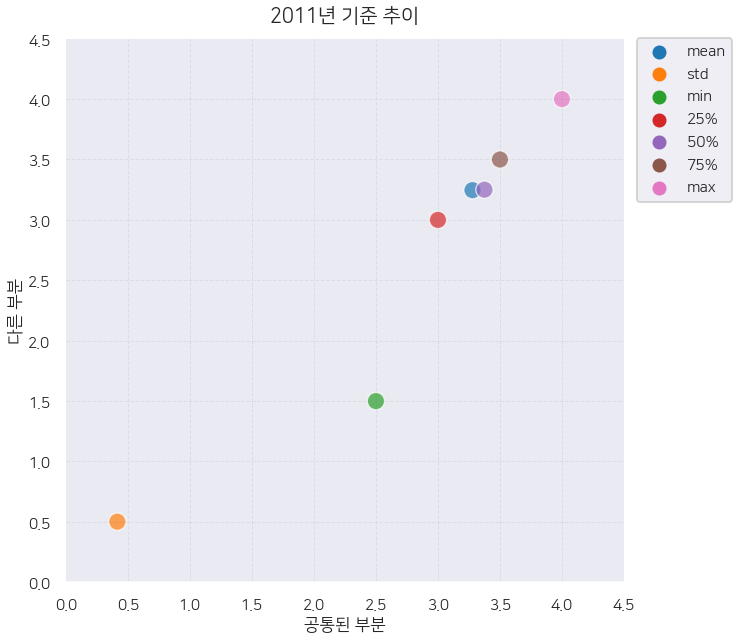

In [187]:
sns.set_style('dark',{'font.family':'NanumSquare'})

fig32= plt.figure(figsize=(10,10))
fig32.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig32.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig32.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area32= fig32.add_subplot(1,1,1)

area32.set_title('2011년 기준 추이', fontsize=60, fontproperties=fontprop, position=(0.5, 1.0+0.02))
ax32 = sns.scatterplot(x="inter", y="differ", data=rating_2011, alpha=0.7, ax=area32, color='#3C5A91', s=300, marker='o', hue='index')
ax32.set_xlabel('공통된 부분', fontsize=17)
ax32.set_ylabel('다른 부분', fontsize=17)

# y축 설정
plt.axhline(y=0.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=1.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=1.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=2.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=2.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=3.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=3.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axhline(y=4.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)


# x축 설정
plt.axvline(x=0.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=1.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=1.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=3.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=3.5, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=4.0, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

# legend 위치 지정
plt.legend(loc='center left', bbox_to_anchor=(1+0.01,0.8+0.05), ncol=1)

# 축 범위 지정
plt.xlim(0,4.5)
plt.ylim(0,4.5)

2011년 평균은 증가했습니다. 

최대, 75% 부분은 공통된 부분과 상이한 부분 동일한 분포를 갖습니다.

50%부분에선 공통된 부분이 미약하게 큰 수치를 보이며,

25% 부분에선 또 동일한 수치를 보입니다.

최소 부분에서 재배지가 상이한 부분이 1.5인 것에 반해 동일한 부분은 2.5의 rating 수치를 보입니다. 

한편 std(표준편차)는 상이한 부분에서 조금 더 높은 수치를 보이고 있습니다.

상이한 부분이 편차는 높을 수 있지만 전반적으로 재배지가 동일한 부분에서 다소 큰 수치를 보입니다. 

이를 참고하여 2011년과 공통되었던 원산지를 참고 할 수 있을 것입니다.

cacao_bean에 대해서는 2008년과는 달리 rating과의 상관관계가 없다 봐도 무방하다는 수치가 나타났습니다.

### **6.Review year & Cacao percent**

In [188]:
review_yr_df.head()

,review_year,REF,cacao_percent,rating,blended,g_count,bean_born_same,c_count,REF_count
0,2006,54.375000,71.000000,3.125000,0.805556,16.722222,0.125000,217.666667,72.0
1,2007,151.155844,72.038961,3.162338,0.792208,11.545455,0.298701,269.558442,77.0
2,2008,256.086022,72.698925,2.994624,0.666667,9.978495,0.161290,267.000000,93.0
3,2009,389.585366,70.443089,3.073171,0.642276,11.414634,0.203252,253.552846,123.0
4,2010,540.306306,70.779279,3.148649,0.477477,9.315315,0.297297,217.819820,111.0


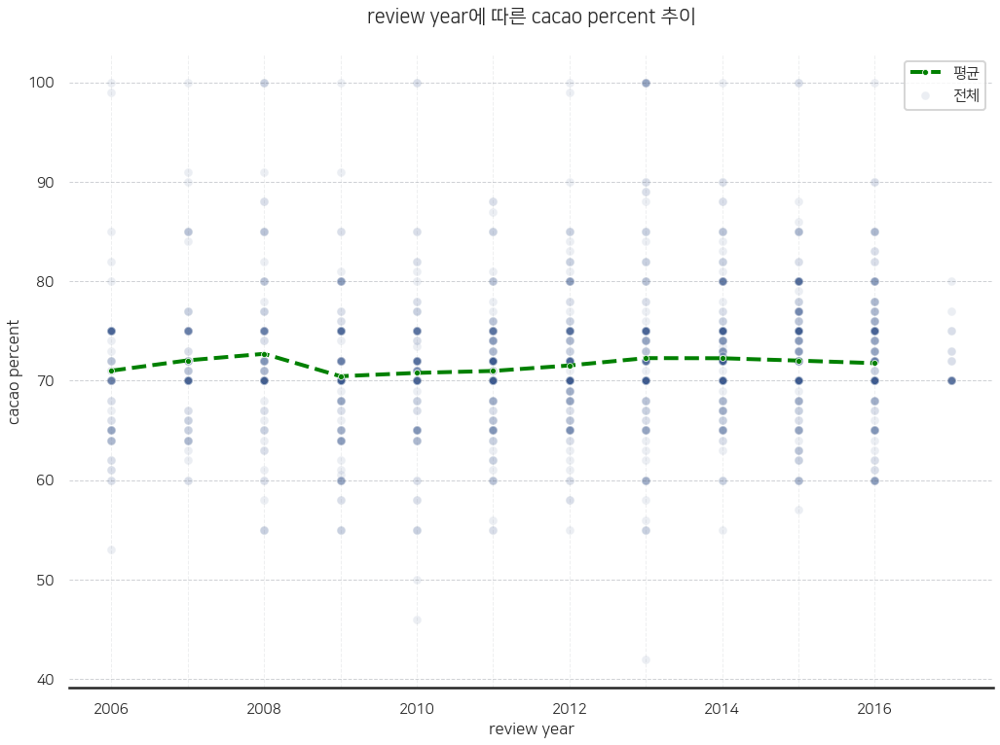

In [189]:
sns.set_style('white',{'font.family':'NanumSquare'})
sns.set_context("poster", font_scale = 0.7, rc={"grid.linewidth": 5})

fig29= plt.figure(figsize=(17,12))
fig29.gca().spines['right'].set_visible(False)   # 오른쪽 테두리 제거
fig29.gca().spines['top'].set_visible(False)     # 위 테두리 제거
fig29.gca().spines['left'].set_visible(False)    # 왼쪽 테두리 제거
area29= fig29.add_subplot(1,1,1)

ax29=sns.lineplot(x= 'review_year',y='cacao_percent',data=review_yr_df.iloc[:-1,:], color='g', ax=area29, marker='.', linestyle='--', label='평균', linewidth=4)
ax29=sns.scatterplot(x= 'review_year',y='cacao_percent',data=df, color='#3C5A91', ax=area29, marker='.', s=300, label='전체', alpha=.1)

ax29.set_title('review year에 따른 cacao percent 추이', fontsize=17, font_properties=fontprop, position=(0.5, 1.0+0.04))
ax29.set_xlabel('review year', fontsize=17)
ax29.set_ylabel('cacao percent', fontsize=17)

# y축 설정
plt.axhline(y=40, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=50, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=60, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=70, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=80, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=90, color='#626774', linestyle='--', linewidth=1, alpha=0.3)
plt.axhline(y=100, color='#626774', linestyle='--', linewidth=1, alpha=0.3)


# x축 설정
plt.axvline(x=2006, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2007, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2008, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2009, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2010, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2011, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2012, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2013, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2014, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2015, color='#626774', linestyle='--', linewidth=1, alpha=0.1)
plt.axvline(x=2016, color='#626774', linestyle='--', linewidth=1, alpha=0.1)

In [190]:
df.review_year.corr(df.cacao_percent)

0.03811512799129296

In [191]:
review_yr_df.review_year.corr(review_yr_df.cacao_percent)

0.23197012558352414

전체 연도에 따른 카카오 함류량과의 상관관계는 없는 것으로 나타나지만, 

카카오 함류량의 평균은 아주 근소하지만 약한 양의 상관관계를 갖습니다.

연도에 따라 카카오 함량이 미약하지만 증가하고 있는 것은 사람들의 건강에 대한 관심이 증가하고 있음을 의미한다 할 수 있습니다.

## 정리

- 회사 빈도 수가 rating에 영향을 끼친다는 것은 많은 제품 수를 보유했다는 것입니다.

  따라서 많은 제품을 보유하는 방향으로 나아가는 것이 좋을 것입니다.

- Bean의 개수를 늘리는 것이 rating에 긍정적 영향을 줄 것입니다.

- Blended 한 개수 상관 없이 Bean을 Blend하는 것이 rating에 긍정적 영향을 끼칩니다.

- 출시한 지역에서의 빈도가 rating에 영향을 주지 않습니다.

- Bean Type 선호도 역시 rating에 영향을 주지 않으므로 어떠한 Bean을 사용해도 무방합니다.

- 특정 지역 배재지에서 rating이 높으므로 그 지역을 활용하면 좋을 것입니다. 

- 재배지와 원산지가 다른 것이 rating에 긍정적 영향을 미칩니다.

- 카카오 함량 70%가 가장 많았으며, 카카오 함량 사용률이 rating에 영향을 미쳤으므로 카카오 70%를 사용하는 것이 rating에 좋을 것입니다.

- 카카오 퍼센트 70 - 75- 72순으로 많이 나왔습니다. 

  카카오 함량이 높을수록 rating에 부정적인 영향을 끼치는 것으로 드러났으나,

  매년 카카오 함량이 증가하는 추세이며 rating 역시 증가하고 있습니다.

  - 이는 사람들의 건강에 대한 관심이 반영되었을 가능성이 있습니다. 

- 고함량 카카오를 타겟으로 할 때 70 - 75 - 72 -80% 순으로 고려할 수 있겠습니다.

--> 추가적으로 가능한 사항: 

    - rating 예측 모델을 구축할 수 있습니다.